# Test 1 - Load and display LAS files

## Test for subtitle
### Test for smaller subtitle
#### Test for much smaller subtitle
##### Test for italized much smaller subtitle

> Test for blockquote
<blockquote> Test for blockquote </blockquote>

`test for code hightlight`

```Python
str = "Test for writing code"
print(str)
```

\$test for writing mathematical operations $

The following work illustrates loading well log data from a file (csv or las) and displaying the data using plot option available.

## Load libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import math
from scipy.optimize import curve_fit
import statsmodels.api as sm # to build a LOWESS model
#from sm.nonparametric.smoothers_lowess import lowess

## Import well file (CSV format)

Import data from well file (CSV) to a pandas Dataframe called **data**. All datasets used is from an open-sourced geoscience subsurface data from *FORCE 2020 lithofacies prediction from well logs competition*, including well log las files, csv file data, NPD lithostratigraphy, well X-Y positions. The following will use training well data to create label.

In [2]:
data = pd.read_csv("wellinputspecproject.csv", sep=',')
#well.head()
#data.dropna(subset=['RXO'])
data['DEPTH'] = data['DEPTH'].abs()
#data.sample(10)
data.head(10)

,Unnamed: 0,WELL,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,SP,BS,DRHO,DTC,DTS,LITHOLOGY
0,18270,15/9-15,460.255005,NaN,1.567587,1.567587,1.735962,-999.900024,78.275825,NaN,NaN,NaN,45.884998,26.000002,NaN,161.947510,NaN,65000
1,18271,15/9-15,460.406982,NaN,1.570050,1.570050,1.744778,-999.900024,79.214615,NaN,NaN,NaN,46.435825,26.000002,NaN,161.267715,NaN,65000
2,18272,15/9-15,460.558990,NaN,1.553659,1.553659,1.752990,-999.900024,79.724106,NaN,NaN,NaN,46.375412,26.000002,NaN,160.644363,NaN,65000
3,18273,15/9-15,460.710999,NaN,1.541216,1.541216,1.760675,-999.900024,81.042778,NaN,NaN,NaN,46.352402,26.000002,NaN,160.212601,NaN,65000
4,18274,15/9-15,460.863007,NaN,1.540456,1.540456,1.767360,-999.900024,80.785133,NaN,NaN,NaN,46.329601,26.000002,NaN,160.315948,NaN,65000
5,18275,15/9-15,461.014984,NaN,1.544103,1.544103,1.768703,-999.900024,79.525040,NaN,NaN,NaN,46.171364,26.000002,NaN,160.850708,NaN,65000
6,18276,15/9-15,461.166992,NaN,1.553223,1.553223,1.772281,-999.900024,78.675018,NaN,NaN,NaN,46.482014,26.000002,NaN,160.810364,NaN,65000
7,18277,15/9-15,461.319000,NaN,1.571347,1.571347,1.781741,-999.900024,76.638680,NaN,NaN,NaN,46.401253,26.000002,NaN,161.222443,NaN,65000
8,18278,15/9-15,461.470978,NaN,1.592619,1.592619,1.792810,-999.900024,76.838600,NaN,155.216309,NaN,46.865376,26.000002,NaN,161.422073,NaN,65000
9,18279,15/9-15,461.622986,NaN,1.606768,1.606768,1.810581,-999.900024,76.436371,NaN,248.745972,NaN,47.240093,26.000002,NaN,161.484421,NaN,65000


In [3]:
#Check statistics of each column
data.describe()

,Unnamed: 0,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,SP,BS,DRHO,DTC,DTS,LITHOLOGY
count,1.400770e+05,140077.000000,139577.000000,108748.000000,138957.000000,140036.000000,62974.000000,140077.000000,116367.000000,109029.000000,139364.000000,116154.000000,139690.000000,139838.000000,139373.000000,22719.000000,140077.000000
mean,4.701613e+05,2125.471440,13.906420,15.555625,4.444007,4.805614,-65.121860,73.856286,0.339446,4.926591,2.267785,67.426755,12.957688,0.006558,112.399053,232.092019,60371.699837
std,3.372078e+05,877.652880,3.849713,133.540332,32.186356,34.087177,266.294642,40.734936,0.126651,5.433695,0.257471,82.950408,3.376665,0.077312,32.382384,88.700826,14866.993011
min,1.827000e+04,175.335449,6.968856,0.005141,0.127000,0.264479,-999.900024,6.024419,-0.031457,0.709315,1.303228,-246.605804,8.500000,-1.279595,7.415132,94.645958,30000.000000
25%,2.662640e+05,1457.890869,11.959803,0.834297,0.890438,0.989702,0.590388,46.469891,0.256761,3.134700,2.054028,41.817820,12.250001,-0.008934,83.135818,158.116066,65000.000000
50%,3.224690e+05,2114.758301,13.004149,1.382122,1.412002,1.553381,1.611258,70.899979,0.342650,3.833919,2.278468,65.318508,12.250001,-0.000183,108.978836,213.784287,65000.000000
75%,7.405780e+05,2764.539551,17.500000,3.182649,3.004032,3.071044,4.307931,92.537567,0.439778,4.933863,2.488813,136.144680,17.500000,0.012330,142.637512,270.818542,65000.000000
max,1.070942e+06,4324.610840,25.717396,1999.800049,1950.000000,1894.385132,1989.840698,843.902954,0.913440,365.575592,3.163656,254.667892,26.000002,0.416213,207.382553,590.718933,99000.000000


In [4]:
#data['RXO']= data['RXO'].replace(<-998, np.NaN, inplace=True)
data.loc[data['RXO'] < 0, 'RXO'] = np.NaN
data.describe()

,Unnamed: 0,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,SP,BS,DRHO,DTC,DTS,LITHOLOGY
count,1.400770e+05,140077.000000,139577.000000,108748.000000,138957.000000,140036.000000,58267.000000,140077.000000,116367.000000,109029.000000,139364.000000,116154.000000,139690.000000,139838.000000,139373.000000,22719.000000,140077.000000
mean,4.701613e+05,2125.471440,13.906420,15.555625,4.444007,4.805614,8.322777,73.856286,0.339446,4.926591,2.267785,67.426755,12.957688,0.006558,112.399053,232.092019,60371.699837
std,3.372078e+05,877.652880,3.849713,133.540332,32.186356,34.087177,49.689120,40.734936,0.126651,5.433695,0.257471,82.950408,3.376665,0.077312,32.382384,88.700826,14866.993011
min,1.827000e+04,175.335449,6.968856,0.005141,0.127000,0.264479,0.059247,6.024419,-0.031457,0.709315,1.303228,-246.605804,8.500000,-1.279595,7.415132,94.645958,30000.000000
25%,2.662640e+05,1457.890869,11.959803,0.834297,0.890438,0.989702,0.743069,46.469891,0.256761,3.134700,2.054028,41.817820,12.250001,-0.008934,83.135818,158.116066,65000.000000
50%,3.224690e+05,2114.758301,13.004149,1.382122,1.412002,1.553381,1.832076,70.899979,0.342650,3.833919,2.278468,65.318508,12.250001,-0.000183,108.978836,213.784287,65000.000000
75%,7.405780e+05,2764.539551,17.500000,3.182649,3.004032,3.071044,4.921375,92.537567,0.439778,4.933863,2.488813,136.144680,17.500000,0.012330,142.637512,270.818542,65000.000000
max,1.070942e+06,4324.610840,25.717396,1999.800049,1950.000000,1894.385132,1989.840698,843.902954,0.913440,365.575592,3.163656,254.667892,26.000002,0.416213,207.382553,590.718933,99000.000000


### Columns list
Including renaming them to make it easier to call the column

In [5]:
#data.rename(columns = {'DEPTH':'DEPTH'}, inplace = True)
data.columns

Index(['Unnamed: 0', 'WELL', 'DEPTH', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RXO',
       'GR', 'NPHI', 'PEF', 'RHOB', 'SP', 'BS', 'DRHO', 'DTC', 'DTS',
       'LITHOLOGY'],
      dtype='object')

### Wells list

In [6]:
well_name=data['WELL'].unique()
print(len(well_name))
well_name

8


array(['15/9-15', '16/4-1', '25/2-7', '25/4-5', '31/2-19 S', '33/9-17',
       '35/11-11', '35/12-1'], dtype=object)

## Selecting data
### Select columns (raw data)

In [7]:
well = data[['WELL','DEPTH','CALI','RSHA','RMED','RDEP','RXO','GR','NPHI','PEF',
             'RHOB','SP','BS','DRHO','DTC','DTS', 'LITHOLOGY']]
well.columns

Index(['WELL', 'DEPTH', 'CALI', 'RSHA', 'RMED', 'RDEP', 'RXO', 'GR', 'NPHI',
       'PEF', 'RHOB', 'SP', 'BS', 'DRHO', 'DTC', 'DTS', 'LITHOLOGY'],
      dtype='object')

In [8]:
well.dtypes.value_counts()

float64    15
object      1
int64       1
Name: count, dtype: int64

In [9]:
well.describe()

,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,SP,BS,DRHO,DTC,DTS,LITHOLOGY
count,140077.000000,139577.000000,108748.000000,138957.000000,140036.000000,58267.000000,140077.000000,116367.000000,109029.000000,139364.000000,116154.000000,139690.000000,139838.000000,139373.000000,22719.000000,140077.000000
mean,2125.471440,13.906420,15.555625,4.444007,4.805614,8.322777,73.856286,0.339446,4.926591,2.267785,67.426755,12.957688,0.006558,112.399053,232.092019,60371.699837
std,877.652880,3.849713,133.540332,32.186356,34.087177,49.689120,40.734936,0.126651,5.433695,0.257471,82.950408,3.376665,0.077312,32.382384,88.700826,14866.993011
min,175.335449,6.968856,0.005141,0.127000,0.264479,0.059247,6.024419,-0.031457,0.709315,1.303228,-246.605804,8.500000,-1.279595,7.415132,94.645958,30000.000000
25%,1457.890869,11.959803,0.834297,0.890438,0.989702,0.743069,46.469891,0.256761,3.134700,2.054028,41.817820,12.250001,-0.008934,83.135818,158.116066,65000.000000
50%,2114.758301,13.004149,1.382122,1.412002,1.553381,1.832076,70.899979,0.342650,3.833919,2.278468,65.318508,12.250001,-0.000183,108.978836,213.784287,65000.000000
75%,2764.539551,17.500000,3.182649,3.004032,3.071044,4.921375,92.537567,0.439778,4.933863,2.488813,136.144680,17.500000,0.012330,142.637512,270.818542,65000.000000
max,4324.610840,25.717396,1999.800049,1950.000000,1894.385132,1989.840698,843.902954,0.913440,365.575592,3.163656,254.667892,26.000002,0.416213,207.382553,590.718933,99000.000000


In [11]:
well.to_csv('well_specproject.csv', sep='\t', index=False)

## Well data preparation
Once data has been imported and sorted through, the next step is to carry out data preparation. This step includes identifying data gaps within depth of each wells, visualising patterns within data, identify possible outliers, and understand relationships between log curves. 

Types of plot that will be used through this project include scatter plot, histogram, Kernel Density Estimate, and boxplot. 

### Plot data availability
Each well curves will be plotted in a separate subplot based on the availability on depth. Wells with most data coverage through depth will be chosen to be analyzed and labeled.
It has similar concept to boxplot distribution of each curve above, but with depth on x-axis instead.

In [10]:
well_plot = well.copy()

for num, col in enumerate(well_plot.columns[2:]):
    well_plot[col] = well_plot[col].notnull() * (num+1)
    well_plot[col].replace(0, num, inplace=True)
    print(col,num)

well_plot = well_plot.groupby('WELL')

CALI 0
RSHA 1
RMED 2
RDEP 3
RXO 4
GR 5
NPHI 6
PEF 7
RHOB 8
SP 9
BS 10
DRHO 11
DTC 12
DTS 13
LITHOLOGY 14


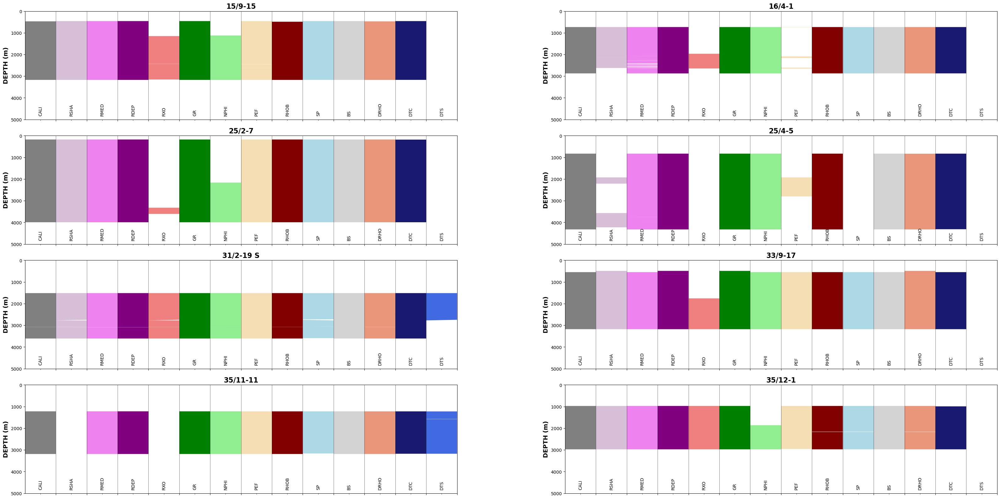

In [11]:
labels = ['CALI','RSHA','RMED','RDEP','RXO','GR','NPHI','PEF','RHOB','SP','BS','DRHO','DTC','DTS']
fig, axs = plt.subplots(4, 2, figsize=(40,20))

#Loop through each well and column in the grouped dataframe
for (name, df), ax in zip(well_plot, axs.flat):
    ax.set_xlim(0,13)
    
    #Setup the depth range
    ax.set_ylim(5000, 0)
    
    #Create multiple fill betweens for each curve# This is between
    # the number representing null values and the number representing
    # actual values
    
    ax.fill_betweenx(df.DEPTH, 0, df.CALI, facecolor='grey')
    ax.fill_betweenx(df.DEPTH, 1, df.RSHA, facecolor='thistle')
    ax.fill_betweenx(df.DEPTH, 2, df.RMED, facecolor='violet')
    ax.fill_betweenx(df.DEPTH, 3, df.RDEP, facecolor='purple')
    ax.fill_betweenx(df.DEPTH, 4, df.RXO, facecolor='lightcoral')
    ax.fill_betweenx(df.DEPTH, 5, df.GR, facecolor='green')
    ax.fill_betweenx(df.DEPTH, 6, df.NPHI, facecolor='lightgreen')
    ax.fill_betweenx(df.DEPTH, 7, df.PEF, facecolor='wheat')
    ax.fill_betweenx(df.DEPTH, 8, df.RHOB, facecolor='maroon')
    ax.fill_betweenx(df.DEPTH, 9, df.SP, facecolor='lightblue')
    ax.fill_betweenx(df.DEPTH, 10, df.BS, facecolor='lightgrey')
    ax.fill_betweenx(df.DEPTH, 11, df.DRHO, facecolor='darksalmon')
    ax.fill_betweenx(df.DEPTH, 12, df.DTC, facecolor='midnightblue')
    ax.fill_betweenx(df.DEPTH, 13, df.DTS, facecolor='royalblue')
    
    #Setup the grid, axis labels and ticks
    ax.grid(axis='x', alpha=0.5, color='black')
    ax.set_ylabel('DEPTH (m)', fontsize=14, fontweight='bold')
    
    #Position vertical lines at the boundaries between the bars
    ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14], minor=False)
    
    #Position the curve names in the centre of each column
    ax.set_xticks([0.5, 1.5 ,2.5 ,3.5 ,4.5 ,5.5 ,6.5 , 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5], minor=True)
    
    #Setup the x-axis tick labels
    ax.set_xticklabels(labels,  rotation='vertical', minor=True, verticalalignment='bottom')
    ax.set_xticklabels('', minor=False)
    ax.tick_params(axis='x', which='minor', pad=-10)
    
    #Assign the well name as the title to each subplot
    ax.set_title(name, fontsize=16, fontweight='bold')

plt.savefig('availabilitywelldata.png')
#plt.tight_layout()
plt.subplots_adjust(hspace=0.15, wspace=0.25)
plt.show()

### Histogram
Histogram can visualize the value range of logs and its distributions in general. It is a great start to identify the outlier data in the whole wells.

array([[<Axes: title={'center': 'DEPTH'}>,
        <Axes: title={'center': 'CALI'}>,
        <Axes: title={'center': 'RSHA'}>,
        <Axes: title={'center': 'RMED'}>],
       [<Axes: title={'center': 'RDEP'}>,
        <Axes: title={'center': 'RXO'}>, <Axes: title={'center': 'GR'}>,
        <Axes: title={'center': 'NPHI'}>],
       [<Axes: title={'center': 'PEF'}>,
        <Axes: title={'center': 'RHOB'}>, <Axes: title={'center': 'SP'}>,
        <Axes: title={'center': 'BS'}>],
       [<Axes: title={'center': 'DRHO'}>,
        <Axes: title={'center': 'DTC'}>, <Axes: title={'center': 'DTS'}>,
        <Axes: title={'center': 'LITHOLOGY'}>]], dtype=object)

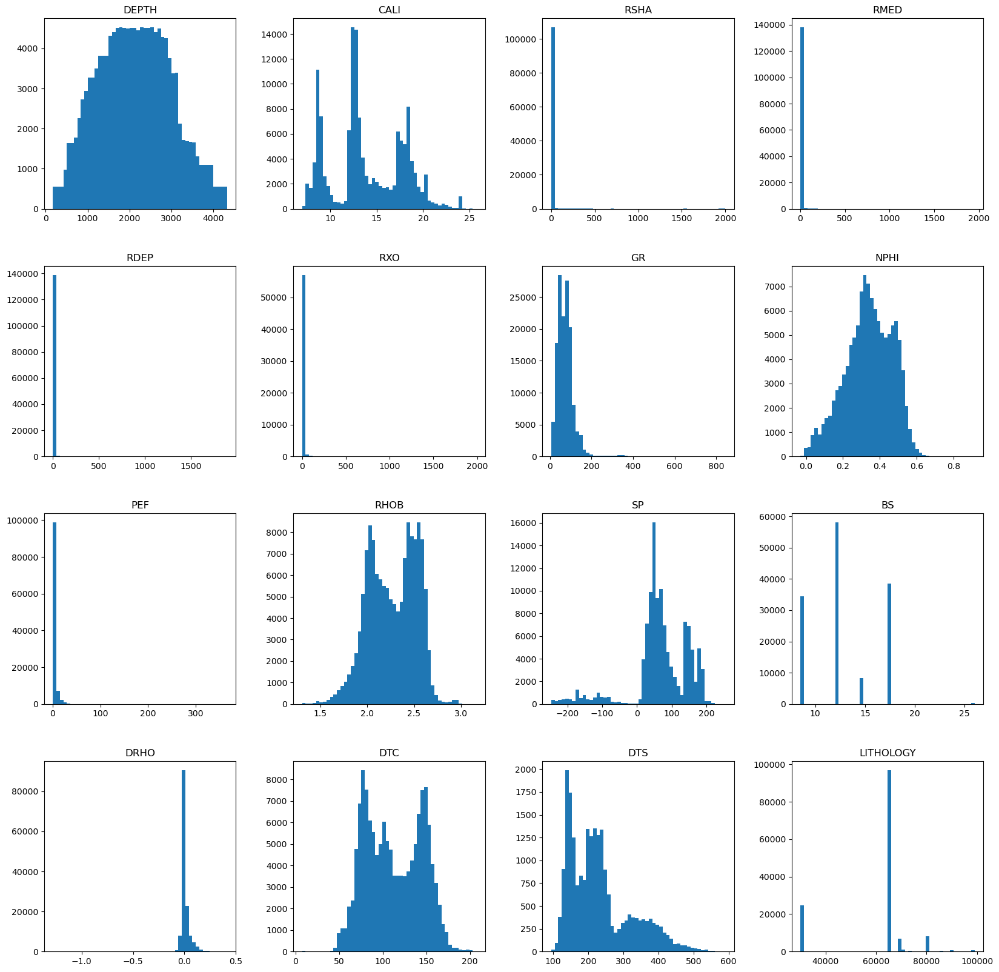

In [12]:
#Histogram for all data columns, except 'Well' as string type
well.hist(bins=50,figsize=(20,20), grid=False)

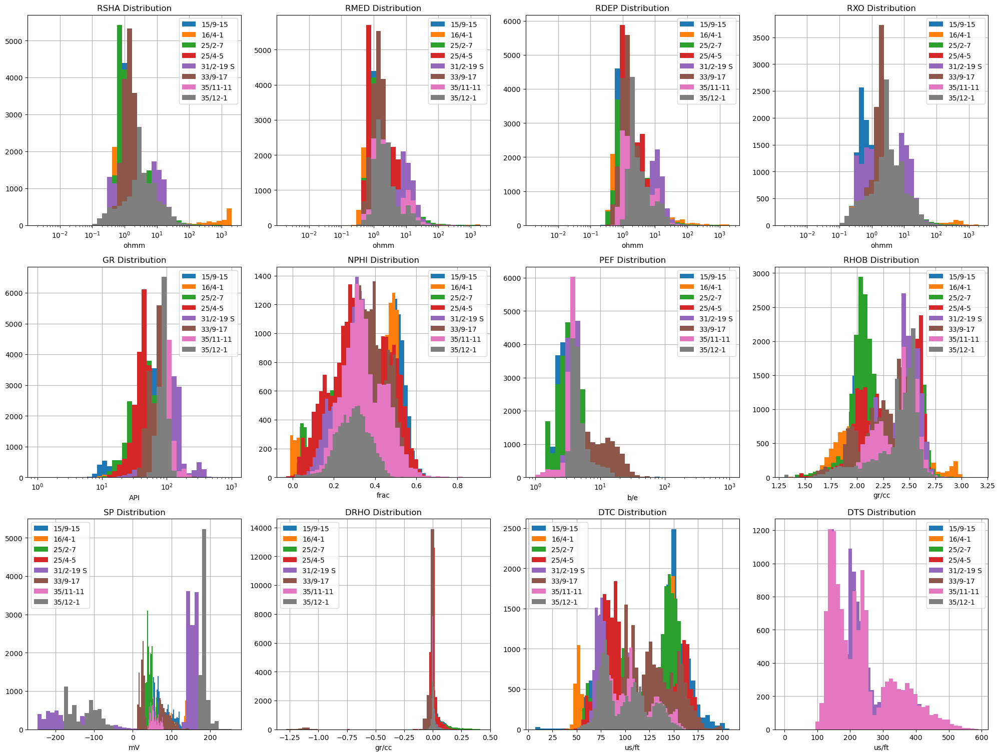

In [10]:
#Histogram on each specific column for more detail
well_curves = list(well) #Create a list of curve names
well_curves.remove("WELL") #Remove the depth curve to focus only on curves
well_curves.remove("DEPTH") #Remove the depth curve to focus only on curves
well_curves.remove("CALI") #Remove the depth curve to focus only on curves
well_curves.remove("BS") #Remove the depth curve to focus only on curves
well_curves.remove("LITHOLOGY") #Remove the depth curve to focus only on curves

fig = plt.figure(figsize=(20,20))

for i, feature in enumerate(well_curves):
    ax=fig.add_subplot(4,4,i+1)
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    fig.suptitle('')
    
    if i<4:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(0.002),np.log10(2000),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('ohmm')
    elif i==4:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(1000),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('API')
    elif i==6:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(1000),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('b/e')
    elif i==5:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('frac')
    elif i==7 or i==9:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('gr/cc')
    elif i==8:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('mV')
    else:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('us/ft')

plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

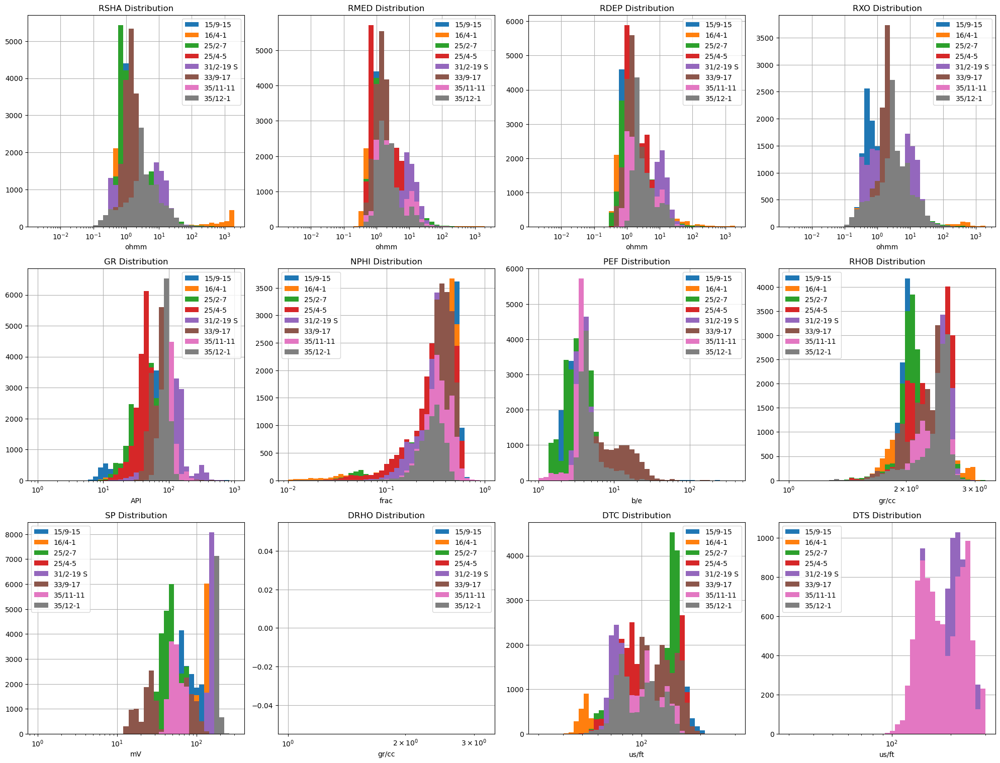

In [20]:
#Histogram on each specific column for more detail
well_curves = list(well) #Create a list of curve names
well_curves.remove("WELL") #Remove the depth curve to focus only on curves
well_curves.remove("DEPTH") #Remove the depth curve to focus only on curves
well_curves.remove("CALI") #Remove the depth curve to focus only on curves
well_curves.remove("BS") #Remove the depth curve to focus only on curves
well_curves.remove("LITHOLOGY") #Remove the depth curve to focus only on curves

fig = plt.figure(figsize=(20,20))

for i, feature in enumerate(well_curves):
    ax=fig.add_subplot(4,4,i+1)
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    fig.suptitle('')
    
    if i<4:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(0.002),np.log10(2000),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('ohmm')
    elif i==4:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(1000),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('API')
    elif i==6:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(400),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('b/e')
    elif i==5:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(0.01),np.log10(1),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('frac')
    elif i==7 or i==9:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(3.2),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('gr/cc')
    elif i==8:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(1),np.log10(300),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('mV')
    else:
        well.groupby('WELL')[feature].hist(bins=np.logspace(np.log10(30),np.log10(300),40), ax=ax, legend=True ,grid=True)
        ax.set_xscale("log")
        ax.set_xlabel('us/ft')

plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

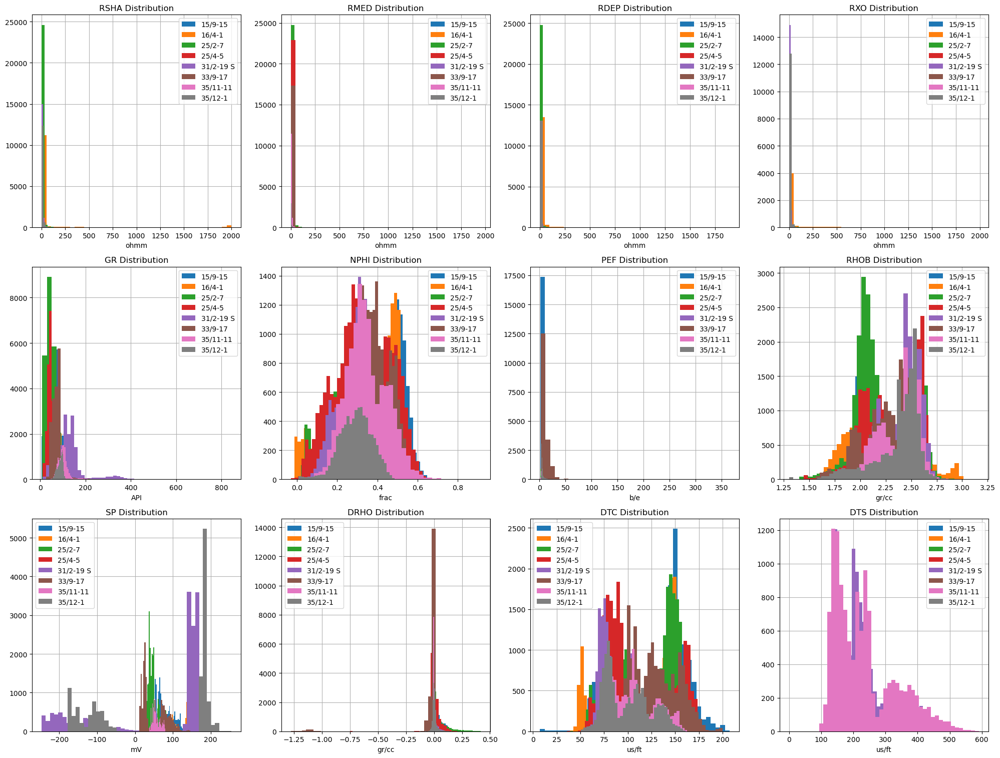

In [31]:
#Histogram on each specific column for more detail
well_curves = list(well) #Create a list of curve names
well_curves.remove("WELL") #Remove the depth curve to focus only on curves
well_curves.remove("DEPTH") #Remove the depth curve to focus only on curves
well_curves.remove("CALI") #Remove the depth curve to focus only on curves
well_curves.remove("BS") #Remove the depth curve to focus only on curves
well_curves.remove("LITHOLOGY") #Remove the depth curve to focus only on curves

fig = plt.figure(figsize=(20,20))

for i, feature in enumerate(well_curves):
    ax=fig.add_subplot(4,4,i+1)
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    fig.suptitle('')
    
    if i<4:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('ohmm')
    elif i==4:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('API')
    elif i==6:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('b/e')
    elif i==5:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('frac')
    elif i==7 or i==9:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('gr/cc')
    elif i==8:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('mV')
    else:
        well.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True ,grid=True)
        ax.set_xscale("linear")
        ax.set_xlabel('us/ft')

plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

WELL
15/9-15      Axes(0.125,0.11;0.775x0.77)
16/4-1       Axes(0.125,0.11;0.775x0.77)
25/2-7       Axes(0.125,0.11;0.775x0.77)
25/4-5       Axes(0.125,0.11;0.775x0.77)
31/2-19 S    Axes(0.125,0.11;0.775x0.77)
33/9-17      Axes(0.125,0.11;0.775x0.77)
35/11-11     Axes(0.125,0.11;0.775x0.77)
35/12-1      Axes(0.125,0.11;0.775x0.77)
Name: GR, dtype: object

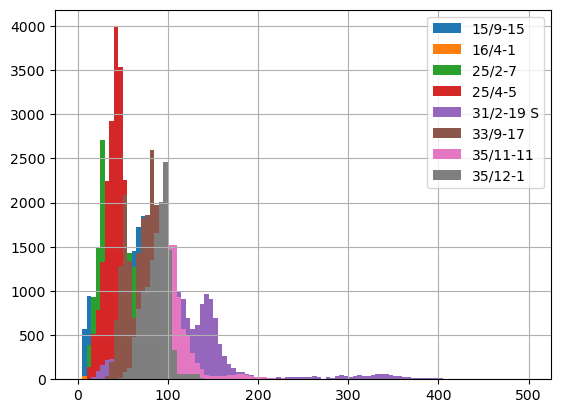

In [14]:
#Histogram on each specific column for more detail
#Histogram through Pandas has smaller bin sizes, so it's easier to illustrate data distribution
well.groupby('WELL')['GR'].hist(bins=100, legend=True, range=(0,500))

### Boxplot
Boxplot can be used to check data coverage and detect outlier in detail for each well.

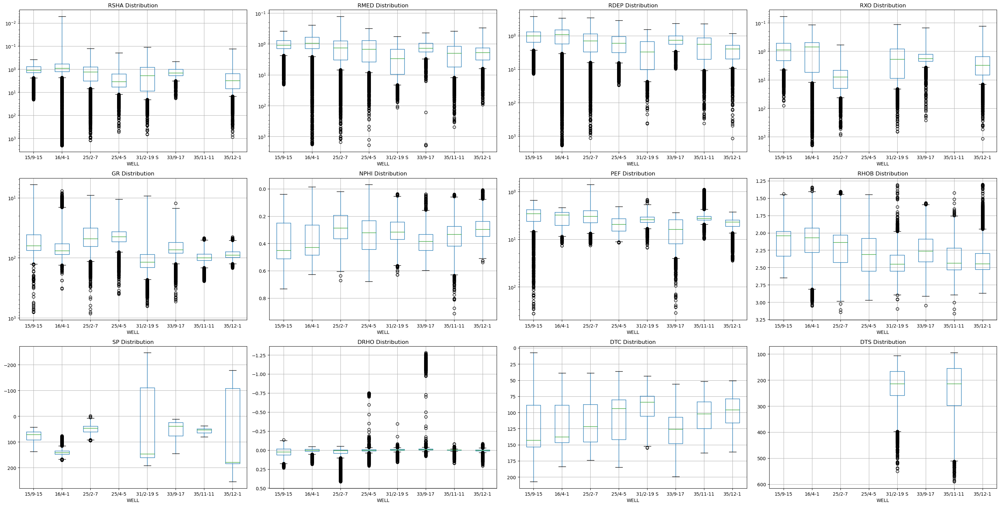

In [15]:
well_box = list(well) #Create a list of curve names
well_box.remove("WELL") #Remove the depth curve to focus only on curves
well_box.remove("DEPTH") #Remove the depth curve to focus only on curves
well_box.remove("CALI") #Remove the depth curve to focus only on curves
well_box.remove("BS") #Remove the depth curve to focus only on curves
well_box.remove("LITHOLOGY") #Remove the depth curve to focus only on curves

fig = plt.figure(figsize=(30,20))

for i, feature in enumerate(well_box):
    ax=fig.add_subplot(4,4,i+1)
    well.boxplot(by ='WELL', column=feature, ax=ax, sharex=False, vert=True, grid=True)
    ax.invert_yaxis()
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    fig.suptitle('')
    
    #ax.set_yscale('log')
    #if i==5 or i==8 or i==9:
        #ax.set_yscale('linear')
    if i<5 or i==6:
        ax.set_yscale('log')
    

#plt.savefig('boxplotcoverage.png')
plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

In [11]:
well_box

['RSHA',
 'RMED',
 'RDEP',
 'RXO',
 'GR',
 'NPHI',
 'PEF',
 'RHOB',
 'SP',
 'DRHO',
 'DTC',
 'DTS']

### Badhole data detection through Scatter plot
In this section we will look at a way to visualize badhole data caused by both borehole enlargement or shrinkage. In here we can use bitsize curve alongside caliper curve to create a difference caliper.

In [14]:
well_bh = well.copy()
well_bh.loc[:,'BH_SIZE'] = well_bh.loc[:,'CALI'] - well_bh.loc[:,'BS']

<Axes: xlabel='NPHI', ylabel='RHOB'>

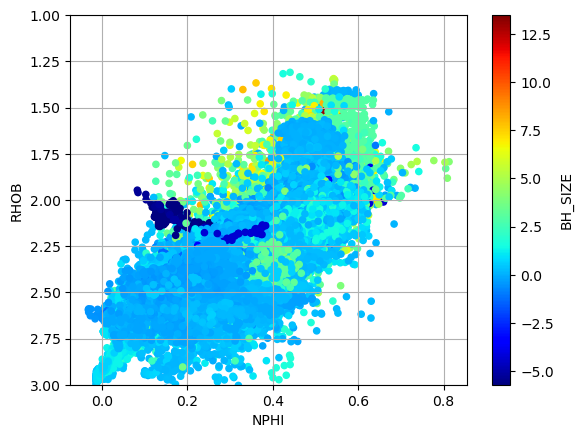

In [15]:
#Scatter plot in general (all wells)
well_bh.plot(kind='scatter', x='NPHI', y='RHOB', c='BH_SIZE', colormap='jet', ylim=(3,1), grid=True)

In [16]:
well_bh = well_bh.groupby('WELL') #Grouping the data according to well names

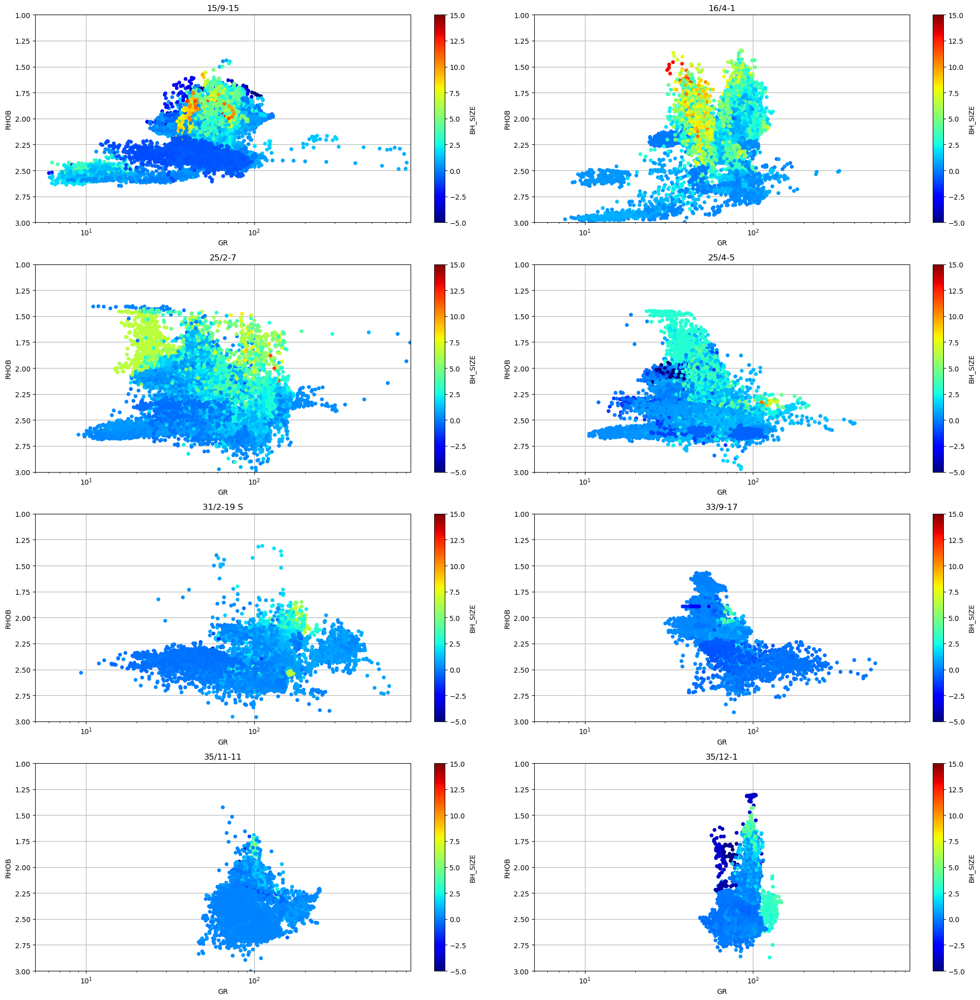

In [23]:
fig, axs = plt.subplots(4, 2, figsize=(20,20))

for (name, df), ax in zip(well_bh, axs.flatten()):
    #ax.set_xlim(0,1)
    #ax.set_ylim(3,1)
    ax.set_xlim(5,850)
    ax.set_xscale('log')
    ax.set_ylim(3,1)
    ax.set_title(name)
    ax.set_axisbelow(True)
    if df['BH_SIZE'].count() ==0:
        continue
    else:
        #df.plot(x='NPHI', y='RHOB', kind='scatter', ax=ax, c='BH_SIZE', colormap='jet', vmin=-5, vmax=15, grid=True)
        df.plot(x='GR', y='RHOB', kind='scatter', ax=ax, c='BH_SIZE', colormap='jet', vmin=-5, vmax=15, grid=True)
        
#plt.savefig('badholedata.png')
plt.subplots_adjust(left=0.55, bottom=0.25, right=0.9, top=0.3, hspace=1.5, wspace=0.5)
plt.tight_layout()

## Logplot setup

The well log display will be created in triple-combo style in matplotlib to visualize the curves. The template will be incorporated into **triple_combo_plot** function, so it can be used depending on the selection of top and bottom depths of the graph.

The triple combo display will consists of:
* First track: Gamma Ray, Caliper, Bit size, SP
* Second track: Resistivities
* Third track: Density, Neutron
* Fourth track: Sonic (Compressional and Shear), PEF


In [21]:
well['LITHOLOGY'].unique()

array([65000, 65030, 30000, 70000, 99000, 80000, 70032, 86000, 74000,
       93000, 90000], dtype=int64)

In [22]:
lithology_numbers = {30000: {'lith':'Sandstone', 'lith_num':1, 'hatch': '..', 'color':'#ffff00'},
                 65030: {'lith':'Shale Sandy', 'lith_num':2, 'hatch':'-.', 'color':'#ffe119'},
                 65000: {'lith':'Shale', 'lith_num':3, 'hatch':'--', 'color':'#bebebe'},
                 80000: {'lith':'Marl', 'lith_num':4, 'hatch':'', 'color':'#7cfc00'},
                 74000: {'lith':'Dolomite', 'lith_num':5, 'hatch':'-/', 'color':'#8080ff'},
                 70000: {'lith':'Limestone', 'lith_num':6, 'hatch':'+', 'color':'#80ffff'},
                 70032: {'lith':'Chalk', 'lith_num':7, 'hatch':'..', 'color':'#80ffff'},
                 88000: {'lith':'Halite', 'lith_num':8, 'hatch':'x', 'color':'#7ddfbe'},
                 86000: {'lith':'Anhydrite', 'lith_num':9, 'hatch':'', 'color':'#ff80ff'},
                 99000: {'lith':'Volcaniclastics', 'lith_num':10, 'hatch':'||', 'color':'#ff8c00'},
                 90000: {'lith':'Coal', 'lith_num':11, 'hatch':'', 'color':'black'},
                 93000: {'lith':'Basement', 'lith_num':12, 'hatch':'-|', 'color':'#ef138a'}}

df_lith = pd.DataFrame.from_dict(lithology_numbers, orient='index')
df_lith.index.name = 'LITHOLOGY'
df_lith

,lith,lith_num,hatch,color
LITHOLOGY,,,,
30000,Sandstone,1,..,#ffff00
65030,Shale Sandy,2,-.,#ffe119
65000,Shale,3,--,#bebebe
80000,Marl,4,,#7cfc00
74000,Dolomite,5,-/,#8080ff
70000,Limestone,6,+,#80ffff
70032,Chalk,7,..,#80ffff
88000,Halite,8,x,#7ddfbe
86000,Anhydrite,9,,#ff80ff


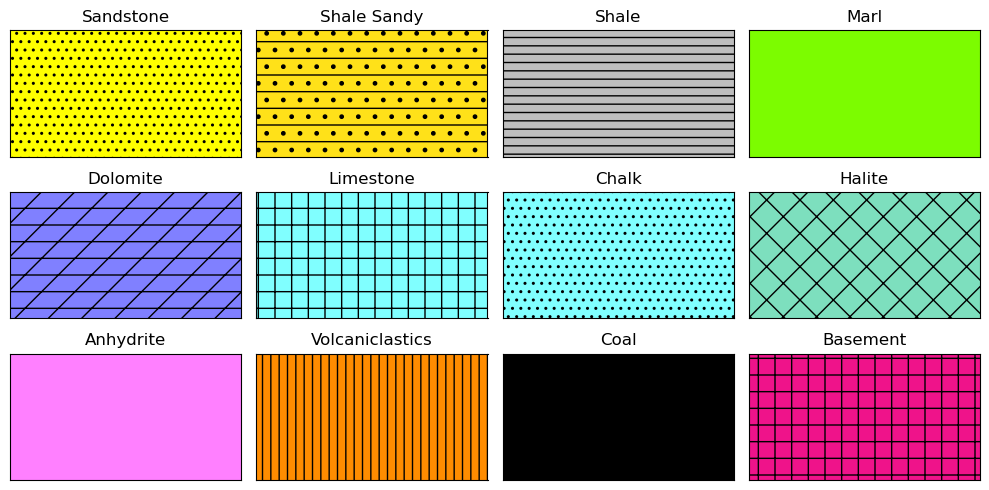

In [23]:
y = [0, 1]
x = [1, 1]

fig, axes = plt.subplots(ncols=4,nrows=3, sharex=True, sharey=True,
                         figsize=(10,5), subplot_kw={'xticks': [], 'yticks': []})

for ax, key in zip(axes.flat, lithology_numbers.keys()):
    ax.plot(x, y)
    ax.fill_betweenx(y, 0, 1, facecolor=lithology_numbers[key]['color'], hatch=lithology_numbers[key]['hatch'])
    ax.set_xlim(0, 0.1)
    ax.set_ylim(0, 1)
    ax.set_title(str(lithology_numbers[key]['lith']))

plt.tight_layout()

plt.show()

In [28]:
def triple_combo_plot(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well[well['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]

    #Set plot axes
    fig, ax = plt.subplots(1,5, figsize=(20,48), sharey=True)
    fig.suptitle("Well " + str(well_name) + " Composite", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

        
    ## Track 1
    #Gamma Ray -- Main track
    ax11 = ax[0].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green")
    ax11.set_xlim(0, 600)
    ax11.set_xlabel("GR (API)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 5))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)

    #Caliper
    if logs['CALI'].count()==0:
        pass
    else:
        ax12 = ax[0].twiny()
        ax12.plot("CALI","DEPTH",'--', data=logs, color="black")
        ax12.set_xlim(6, 36)
        ax12.set_xlabel("CALI (inch)", position='top',color='black')
        ax12.spines["top"].set_position(("outward", 35))
        ax12.spines["top"].set_edgecolor("black")
        ax12.tick_params(axis='x', colors="black")
        ax12.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    if logs['BS'].count()==0:
        pass
    else:
        ax13 = ax[0].twiny()
        ax13.plot("BS","DEPTH",':', data=logs, color="black")
        ax13.set_xlim(6, 36)
        ax13.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)

    #SP
    if logs['SP'].count()==0:
        pass
    else:
        ax14 = ax[0].twiny()
        ax14.plot("SP","DEPTH", data=logs, color="blue")
        ax14.set_xlim(-200, 200)
        ax14.set_xlabel("SP (mV)", position='top',color='blue')
        ax14.spines["top"].set_position(("outward", 65))
        ax14.spines["top"].set_edgecolor("blue")
        ax14.tick_params(axis='x', colors="blue")
        ax14.set_xticks([-200, -100, 0, 100, 200])


    ##Track 2
    #Deep resistivity -- Main track
    ax21=ax[1].twiny()
    ax21.plot("RDEP","DEPTH", data=logs, color="red")
    ax21.set_xlim(0.2, 2000)
    ax21.set_xlabel("RDEP (ohmm)", position='top',color='red')
    ax21.set_xscale('log')
    ax21.spines["top"].set_position(("outward", 5))
    ax21.spines["top"].set_edgecolor("red")
    ax21.tick_params(axis='x', colors="red")
    ax21.set_xticks([0.2, 2, 20, 200, 2000])
    ax21.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    ax21.grid(True)

    #Medium resistivity
    if logs['RMED'].count()==0:
        pass
    else:
        ax22=ax[1].twiny()
        ax22.plot("RMED","DEPTH", data=logs, color="purple")
        ax22.set_xlim(0.2, 2000)
        ax22.set_xlabel("RMED (ohmm)", position='top',color='purple')
        ax22.set_xscale('log')
        ax22.spines["top"].set_position(("outward", 35))
        ax22.spines["top"].set_edgecolor("purple")
        ax22.tick_params(axis='x', colors="purple")
        ax22.set_xticks([0.2, 2, 20, 200, 2000])
        ax22.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    #Shallow resistivity
    if logs['RSHA'].count()==0:
        pass
    else:
        ax23=ax[1].twiny()
        ax23.plot("RSHA","DEPTH", data=logs, color="blue")
        ax23.set_xlim(0.2, 2000)
        ax23.set_xlabel("RSHA (ohmm)", position='top',color='blue')
        ax23.set_xscale('log')
        ax23.spines["top"].set_position(("outward", 65))
        ax23.spines["top"].set_edgecolor("blue")
        ax23.tick_params(axis='x', colors="blue")
        ax23.set_xticks([0.2, 2, 20, 200, 2000])
        ax23.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    #Microresistivity
    if logs['RXO'].count()==0:
        pass
    else:
        ax24=ax[1].twiny()
        ax24.plot("RXO","DEPTH", data=logs, color="black")
        ax24.set_xlim(0.2, 2000)
        ax24.set_xlabel("RXO (ohmm)", position='top',color='black')
        ax24.set_xscale('log')
        ax24.spines["top"].set_position(("outward", 95))
        ax24.spines["top"].set_edgecolor("black")
        ax24.tick_params(axis='x', colors="black")
        ax24.set_xticks([0.2, 2, 20, 200, 2000])
        ax24.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

        
    ##Track 3
    #Density -- Main track
    ax31=ax[2].twiny()
    ax31.plot("RHOB","DEPTH", data=logs, color="red")
    ax31.set_xlim(1.95, 2.95)
    ax31.set_xlabel("RHOB (g/cm3)", position='top',color='red')
    ax31.spines["top"].set_position(("outward", 5))
    ax31.spines["top"].set_edgecolor("red")
    ax31.tick_params(axis='x', colors="red")
    ax31.set_xticks([1.95, 2.2, 2.45, 2.7, 2.95])
    ax31.grid(True)
        
    #Neutron
    ax32=ax[2].twiny()
    ax32.plot("NPHI","DEPTH", data=logs, color="green")
    ax32.set_xlim(-0.15, 0.45)
    ax32.invert_xaxis()
    ax32.set_xlabel("NPHI (frac)", position='top',color='green')
    ax32.spines["top"].set_position(("outward", 35))
    ax32.spines["top"].set_edgecolor("green")
    ax32.tick_params(axis='x', colors="green")
    ax32.set_xticks([-0.15, 0, 0.15, 0.30, 0.45])

    #Density correction
    if logs['DRHO'].count()==0:
        pass
    else:
        ax31=ax[2].twiny()
        ax31.plot("DRHO","DEPTH", '--', data=logs, color="black")
        ax31.set_xlim(-0.9, 0.3)
        ax31.set_xlabel("DRHO (g/cm3)", position='top',color='black')
        ax31.spines["top"].set_position(("outward", 65))
        ax31.spines["top"].set_edgecolor("black")
        ax31.tick_params(axis='x', colors="black")
        #ax31.set_xticks([1.95, 2.2, 2.45, 2.7, 2.95])

    
    ##Track 4
    #Sonic compressional
    ax41=ax[3].twiny()
    ax41.plot("DTC","DEPTH", data=logs, color="purple")
    ax41.set_xlim(240, 40)
    ax41.set_xlabel("DTC (us/ft)", position='top',color='purple')
    ax41.spines["top"].set_position(("outward", 5))
    ax41.spines["top"].set_edgecolor("purple")
    ax41.tick_params(axis='x', colors="purple")
    #ax41.set_xticks([140, 120, 100, 80, 60, 40])
    ax41.grid(True)

    #Sonic shear
    if logs['DTS'].count()==0:
        pass
    else:
        ax42=ax[3].twiny()
        ax42.plot("DTS","DEPTH", data=logs, color="blue")
        ax42.set_xlim(240, 40)
        ax42.set_xlabel("DTS (us/ft)", position='top',color='blue')
        ax42.spines["top"].set_position(("outward", 35))
        ax42.spines["top"].set_edgecolor("blue")
        ax42.tick_params(axis='x', colors="blue")
        #ax42.set_xticks([140, 120, 100, 80, 60, 40])
        
    #PEF
    if logs['PEF'].count()==0:
        pass
    else:
        ax43=ax[3].twiny()
        ax43.plot("PEF","DEPTH", data=logs, color="green")
        ax43.set_xlim(0, 20)
        ax43.set_xlabel("PEF (b/e)", position='top',color='green')
        ax43.spines["top"].set_position(("outward", 65))
        ax43.spines["top"].set_edgecolor("green")
        ax43.tick_params(axis='x', colors="green")
        #ax43.set_xticks([140, 120, 100, 80, 60, 40])
        
    #Track 5
    ##Lithology log
    if logs['LITHOLOGY'].count()==0:
        pass
    else:
        ax51=ax[4].twiny()
        ax51.plot("LITHOLOGY","DEPTH", data=logs,  color = 'black', linewidth = 0.5)
        ax51.set_xlim(0, 1)
        ax51.set_xlabel("LITHOLOGY", position='top',color='black')
        ax51.spines["top"].set_position(("outward", 0))
        ax51.spines["top"].set_edgecolor("black")
        ax51.tick_params(axis='x', colors="black")
        ax51.set_xticks([0, 1])
        
        for key in lithology_numbers.keys():
            color = lithology_numbers[key]['color']
            hatch = lithology_numbers[key]['hatch']
            ax51.fill_betweenx(well['DEPTH'], 0, well['LITHOLOGY'], where=(well['LITHOLOGY']==key),
                              facecolor=color, hatch=hatch)
    
        
    fig.tight_layout()

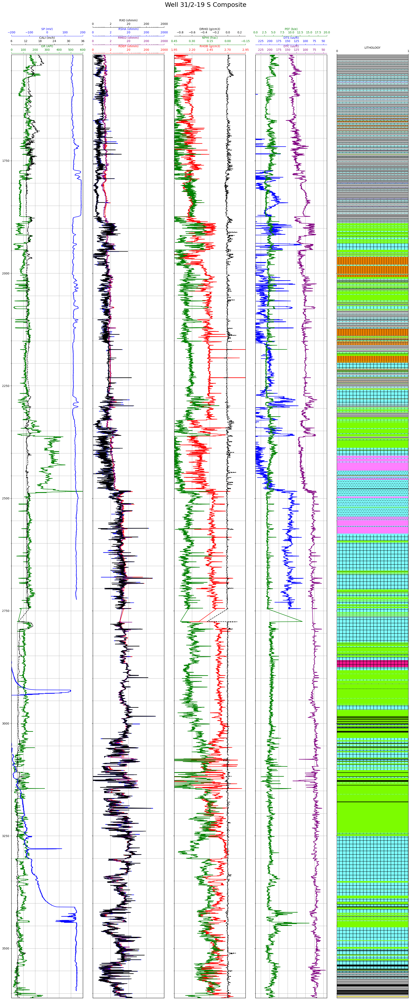

In [29]:
#Display logs for the whole well

triple_combo_plot('31/2-19 S',well[well['WELL'] == '31/2-19 S'].DEPTH.min(),well[well['WELL'] == '31/2-19 S'].DEPTH.max())

### Select zone for analysis

In [ ]:
triple_combo_plot('25/9-1', 2000, 2500)
plt.tight_layout()

## Simple notes and tricks

In [ ]:
#select data statisctic in one column
well["Lithology_geolink"].describe()

In [ ]:
#select data (in this case from depth range)
analyzed_data = well[(well["DEPTH"] > 3000) & (well["DEPTH"] < 3500)]
analyzed_data

## Highlight the unusual data points

In [16]:
def highlight_plot(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well[well['WELL'] == well_name]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.2) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
    #logs[(logs.DRHO <= -0.2)] = np.nan #For Well 33/9-17
    #logs[(logs.DEPTH >= 1758) & (logs.DEPTH <= 1759)] = np.nan #For qwll 33/9-17
    logs[(logs.CALI.any() == np.nan)] = np.nan
          
    #Set plot axes
    fig, ax = plt.subplots(1,5, figsize=(20,48), sharey=True)
    fig.suptitle("Well " + str(well_name) + " Composite", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

        
    ## Track 1
    #Gamma Ray -- Main track
    ax11 = ax[0].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green")
    ax11.set_xlim(0, 250)
    ax11.set_xlabel("GR (API)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 5))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
        

    #Caliper
    if logs['CALI'].count()==0:
        pass
    else:
        ax12 = ax[0].twiny()
        ax12.plot("CALI","DEPTH",'--', data=logs, color="black")
        ax12.set_xlim(6, 36)
        ax12.set_xlabel("CALI (inch)", position='top',color='black')
        ax12.spines["top"].set_position(("outward", 35))
        ax12.spines["top"].set_edgecolor("black")
        ax12.tick_params(axis='x', colors="black")
        ax12.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    if logscopy['BS'].count()==0:
        pass
    else:
        ax13 = ax[0].twiny()
        ax13.plot("BS","DEPTH",':', data=logscopy, color="black")
        ax13.set_xlim(6, 36)
        ax13.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)


    #SP
    if logs['SP'].count()==0:
        pass
    else:
        ax14 = ax[0].twiny()
        ax14.plot("SP","DEPTH", data=logs, color="blue")
        ax14.set_xlim(-200, 200)
        ax14.set_xlabel("SP (mV)", position='top',color='blue')
        ax14.spines["top"].set_position(("outward", 65))
        ax14.spines["top"].set_edgecolor("blue")
        ax14.tick_params(axis='x', colors="blue")
        ax14.set_xticks([-200, -100, 0, 100, 200])


    ##Track 2
    #Deep resistivity -- Main track
    ax21=ax[1].twiny()
    ax21.plot("RDEP","DEPTH", data=logs, color="red")
    ax21.set_xlim(0.2, 2000)
    ax21.set_xlabel("RDEP (ohmm)", position='top',color='red')
    ax21.set_xscale('log')
    ax21.spines["top"].set_position(("outward", 5))
    ax21.spines["top"].set_edgecolor("red")
    ax21.tick_params(axis='x', colors="red")
    ax21.set_xticks([0.2, 2, 20, 200, 2000])
    ax21.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    ax21.grid(True)

    #Medium resistivity
    if logs['RMED'].count()==0:
        pass
    else:
        ax22=ax[1].twiny()
        ax22.plot("RMED","DEPTH", data=logs, color="purple")
        ax22.set_xlim(0.2, 2000)
        ax22.set_xlabel("RMED (ohmm)", position='top',color='purple')
        ax22.set_xscale('log')
        ax22.spines["top"].set_position(("outward", 35))
        ax22.spines["top"].set_edgecolor("purple")
        ax22.tick_params(axis='x', colors="purple")
        ax22.set_xticks([0.2, 2, 20, 200, 2000])
        ax22.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    #Shallow resistivity
    if logs['RSHA'].count()==0:
        pass
    else:
        ax23=ax[1].twiny()
        ax23.plot("RSHA","DEPTH", data=logs, color="blue")
        ax23.set_xlim(0.2, 2000)
        ax23.set_xlabel("RSHA (ohmm)", position='top',color='blue')
        ax23.set_xscale('log')
        ax23.spines["top"].set_position(("outward", 65))
        ax23.spines["top"].set_edgecolor("blue")
        ax23.tick_params(axis='x', colors="blue")
        ax23.set_xticks([0.2, 2, 20, 200, 2000])
        ax23.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    #Microresistivity
    if logs['RXO'].count()==0:
        pass
    else:
        ax24=ax[1].twiny()
        ax24.plot("RXO","DEPTH", data=logs, color="black")
        ax24.set_xlim(0.2, 2000)
        ax24.set_xlabel("RXO (ohmm)", position='top',color='black')
        ax24.set_xscale('log')
        ax24.spines["top"].set_position(("outward", 95))
        ax24.spines["top"].set_edgecolor("black")
        ax24.tick_params(axis='x', colors="black")
        ax24.set_xticks([0.2, 2, 20, 200, 2000])
        ax24.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

        
    ##Track 3
    #Density -- Main track
    ax31=ax[2].twiny()
    ax31.plot("RHOB","DEPTH", data=logs, color="red")
    ax31.set_xlim(1.95, 2.95)
    ax31.set_xlabel("RHOB (g/cm3)", position='top',color='red')
    ax31.spines["top"].set_position(("outward", 5))
    ax31.spines["top"].set_edgecolor("red")
    ax31.tick_params(axis='x', colors="red")
    ax31.set_xticks([1.95, 2.2, 2.45, 2.7, 2.95])
    ax31.grid(True)
        
    #Neutron
    ax32=ax[2].twiny()
    ax32.plot("NPHI","DEPTH", data=logs, color="green")
    ax32.set_xlim(-0.15, 0.45)
    ax32.invert_xaxis()
    ax32.set_xlabel("NPHI (frac)", position='top',color='green')
    ax32.spines["top"].set_position(("outward", 35))
    ax32.spines["top"].set_edgecolor("green")
    ax32.tick_params(axis='x', colors="green")
    ax32.set_xticks([-0.15, 0, 0.15, 0.30, 0.45])

    #Density correction
    if logs['DRHO'].count()==0:
        pass
    else:
        ax31=ax[2].twiny()
        ax31.plot("DRHO","DEPTH", '--', data=logs, color="black")
        ax31.set_xlim(-0.9, 0.3)
        ax31.set_xlabel("DRHO (g/cm3)", position='top',color='black')
        ax31.spines["top"].set_position(("outward", 65))
        ax31.spines["top"].set_edgecolor("black")
        ax31.tick_params(axis='x', colors="black")
        #ax31.set_xticks([1.95, 2.2, 2.45, 2.7, 2.95])

    
    ##Track 4
    #Sonic compressional
    ax41=ax[3].twiny()
    ax41.plot("DTC","DEPTH", data=logs, color="purple")
    ax41.set_xlim(240, 40)
    ax41.set_xlabel("DTC (us/ft)", position='top',color='purple')
    ax41.spines["top"].set_position(("outward", 5))
    ax41.spines["top"].set_edgecolor("purple")
    ax41.tick_params(axis='x', colors="purple")
    #ax41.set_xticks([140, 120, 100, 80, 60, 40])
    ax41.grid(True)

    #Sonic shear
    if logs['DTS'].count()==0:
        pass
    else:
        ax42=ax[3].twiny()
        ax42.plot("DTS","DEPTH", data=logs, color="blue")
        ax42.set_xlim(240, 40)
        ax42.set_xlabel("DTS (us/ft)", position='top',color='blue')
        ax42.spines["top"].set_position(("outward", 35))
        ax42.spines["top"].set_edgecolor("blue")
        ax42.tick_params(axis='x', colors="blue")
        #ax42.set_xticks([140, 120, 100, 80, 60, 40])
        
    #PEF
    if logs['PEF'].count()==0:
        pass
    else:
        ax43=ax[3].twiny()
        ax43.plot("PEF","DEPTH", data=logs, color="green")
        ax43.set_xlim(0, 20)
        ax43.set_xlabel("PEF (b/e)", position='top',color='green')
        ax43.spines["top"].set_position(("outward", 65))
        ax43.spines["top"].set_edgecolor("green")
        ax43.tick_params(axis='x', colors="green")
        #ax43.set_xticks([140, 120, 100, 80, 60, 40])
        
    #Track 5
    ##Lithology log
    if logs['LITHOLOGY'].count()==0:
        pass
    else:
        ax51=ax[4].twiny()
        ax51.plot("LITHOLOGY","DEPTH", data=logs,  color = 'black', linewidth = 0.5)
        ax51.set_xlim(0, 1)
        ax51.set_xlabel("LITHOLOGY", position='top',color='black')
        ax51.spines["top"].set_position(("outward", 0))
        ax51.spines["top"].set_edgecolor("black")
        ax51.tick_params(axis='x', colors="black")
        ax51.set_xticks([0, 1])
        
        for key in lithology_numbers.keys():
            color = lithology_numbers[key]['color']
            hatch = lithology_numbers[key]['hatch']
            ax51.fill_betweenx(well['DEPTH'], 0, well['LITHOLOGY'], where=(well['LITHOLOGY']==key),
                              facecolor=color, hatch=hatch)
    
        
    fig.tight_layout()

C:\Users\V330\AppData\Local\Temp\ipykernel_11344\1265838263.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']


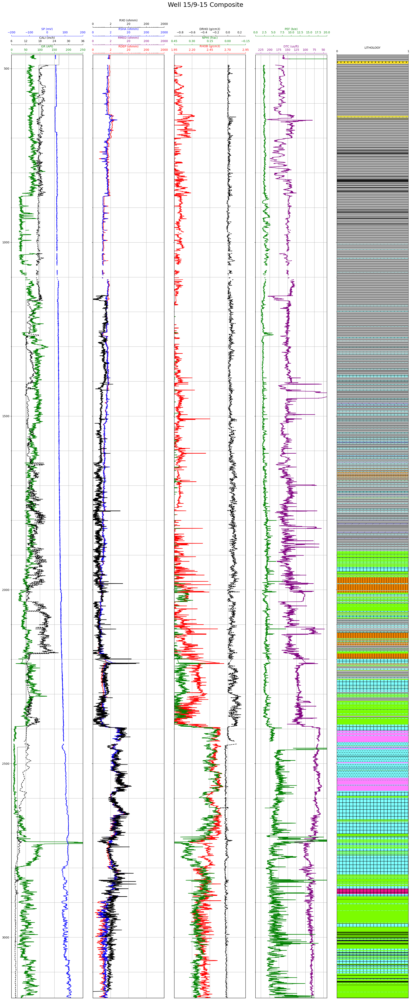

In [17]:
highlight_plot('15/9-15',well[well['WELL'] == '15/9-15'].DEPTH.min(),well[well['WELL'] == '15/9-15'].DEPTH.max())

## Select well data used

There are 8 wells that will be analyzed.
1. **15/9-15** 
2. **16/4-1** 
3. **25/2-7**
4. **25/4-5** 
5. **31/2-19 S** 
6. **33/9-17**       
7. **35/11-11** 
8. **35/12-1**


In [203]:
well_name = '35/12-1'
well_ex = well[well['WELL'] == well_name]
#well_ex = well.copy()
well_ex.describe()

,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,SP,BS,DRHO,DTC,DTS,LITHOLOGY
count,13125.000000,13125.000000,13125.000000,13119.000000,13125.000000,13125.000000,13125.000000,7270.000000,13016.000000,13039.000000,13040.000000,13125.000000,13048.000000,12998.000000,0.0,13125.000000
mean,1970.970506,15.808821,6.828044,3.514323,5.103596,6.549568,88.098893,0.292476,5.215630,2.371362,59.961688,15.539950,0.005929,99.185504,NaN,64556.225524
std,577.641352,2.851160,18.394359,4.992149,14.889153,17.972338,13.544849,0.079870,2.553484,0.230287,154.295910,2.773620,0.022508,23.930554,NaN,9246.687264
min,972.515381,11.687234,0.132300,0.300793,0.863663,0.132000,44.876740,0.008002,2.657487,1.303228,-178.194748,12.250001,-0.084968,50.629776,NaN,30000.000000
25%,1471.207642,12.406140,1.539821,1.349151,1.929102,1.535615,78.908562,0.238558,3.920181,2.295040,-108.595840,12.250001,-0.004795,78.751373,NaN,65000.000000
50%,1969.849487,17.375000,3.129728,1.918338,2.466055,3.115180,90.092850,0.296311,4.349172,2.445764,178.743073,17.500000,0.002483,95.987099,NaN,65000.000000
75%,2467.664551,17.661928,6.880682,3.298535,4.931005,6.717912,97.614502,0.347851,5.321606,2.527478,184.071030,17.500000,0.010528,116.141304,NaN,65030.000000
max,2974.428467,22.365843,873.041077,93.318336,1176.119629,1170.645264,147.219666,0.539353,28.232821,2.870786,254.667892,25.999998,0.208308,160.906021,NaN,80000.000000


In [204]:
well_ex.isnull().sum()

WELL             0
DEPTH            0
CALI             0
RSHA             0
RMED             6
RDEP             0
RXO              0
GR               0
NPHI          5855
PEF            109
RHOB            86
SP              85
BS               0
DRHO            77
DTC            127
DTS          13125
LITHOLOGY        0
dtype: int64

In [205]:
well_data = well_ex.copy()
well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
#logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
logs=well_data.copy()

#logs[(logs.BH_SIZE <= -1.2) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
#logs[(logs.DRHO <= -0.2)] = np.nan #For Well 33/9-17
#logs[(logs.DEPTH >= 1758) & (logs.DEPTH <= 1759)] = np.nan #For qwll 33/9-17
logs[(logs.CALI.any() == np.nan)] = np.nan

#Check detailed data
logs_display=logs[(logs.DEPTH >= 1700) & (logs.DEPTH <= 1800)]

with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(logs_display)


           WELL     DEPTH    CALI   RSHA   RMED   RDEP    RXO      GR  NPHI   
131739  35/12-1  1700.052  17.531  2.960  1.622  2.221  2.819  85.762   NaN  \
131740  35/12-1  1700.204  17.531  2.952  1.611  2.201  2.816  86.507   NaN   
131741  35/12-1  1700.356  17.531  2.863  1.605  2.197  2.827  86.602   NaN   
131742  35/12-1  1700.508  17.531  2.804  1.613  2.214  2.928  86.459   NaN   
131743  35/12-1  1700.659  17.531  2.826  1.630  2.249  3.058  86.622   NaN   
131744  35/12-1  1700.811  17.531  2.884  1.660  2.303  3.501  86.711   NaN   
131745  35/12-1  1700.963  17.531  3.015  1.698  2.365  3.337  85.001   NaN   
131746  35/12-1  1701.115  17.531  3.321  1.735  2.426  3.204  81.901   NaN   
131747  35/12-1  1701.267  17.531  3.467  1.775  2.497  3.096  80.145   NaN   
131748  35/12-1  1701.418  17.531  3.219  1.785  2.510  3.041  81.966   NaN   
131749  35/12-1  1701.570  17.531  3.139  1.767  2.474  3.094  83.767   NaN   
131750  35/12-1  1701.722  17.538  3.050  1.742  2.4

## Smoothing techniques

In [206]:
well_test = well_ex.copy()
#well_test = well.copy()
well_test.loc[:,'BH_SIZE'] = well_test.loc[:,'CALI'] - well_test.loc[:,'BS']
well_test[(well_test.BH_SIZE <= -1.4) & (well_test.BH_SIZE >= well_test.BH_SIZE.min())] = np.nan

### Moving Averages

In [207]:
#Simple moving average
well_test['GR_MA10'] = well_test['GR'].rolling(window=10, min_periods=1).mean()
well_test['GR_MA20'] = well_test['GR'].rolling(window=30, min_periods=1).mean()
well_test['GR_MA30'] = well_test['GR'].rolling(window=50, min_periods=1).mean()

In [208]:
#Exponentially weighted moving average
well_test['GR_EWM10'] = well_test['GR'].ewm(alpha=0.01, min_periods=1).mean()
well_test['GR_EWM20'] = well_test['GR'].ewm(alpha=0.05, min_periods=1).mean()
well_test['GR_EWM30'] = well_test['GR'].ewm(alpha=0.1, min_periods=1).mean()

### Gaussian Kernel

In [209]:
#Gaussian smoothing
def fwhm2std(window_size):
    std = window_size / np.sqrt(8*np.log(2))
    return std

#std = fwhm2std(well_test['GR'].std())
std = fwhm2std(100)
well_test['GR_GK10'] = well_test['GR'].rolling(window=10, win_type="gaussian", center=True, min_periods=1).mean(std=std)

well_test['GR_GK20'] = well_test['GR'].rolling(window=50, win_type="gaussian", center=True, min_periods=1).mean(std=std)

well_test['GR_GK30'] = well_test['GR'].rolling(window=100, win_type="gaussian", center=True, min_periods=1).mean(std=std)

In [210]:
well_test["GR_MA30"].describe()

count    12937.000000
mean        88.367539
std         11.938735
min         47.285061
25%         81.651103
50%         89.965006
75%         96.707632
max        132.578943
Name: GR_MA30, dtype: float64

In [211]:
well_test["GR"].describe()

count    12888.000000
mean        88.411751
std         13.258671
min         44.876740
25%         79.460760
50%         90.299633
75%         97.671711
max        147.219666
Name: GR, dtype: float64

### LOWESS Method

In [212]:
#LOWESS method, needs a long time to simulate
well_lowess = well_ex.copy()
well_lowess.loc[:,'BH_SIZE'] = well_lowess.loc[:,'CALI'] - well_lowess.loc[:,'BS']
well_lowess[(well_lowess.BH_SIZE <= -1.4) & (well_lowess.BH_SIZE >= well_lowess.BH_SIZE.min())] = np.nan
well_lowess = well_lowess.fillna(method="ffill")

y = well_ex['DEPTH'].values

x = well_lowess['GR'].values

GR_LS10 = sm.nonparametric.lowess(x, y, frac=0.001) # note, default frac=2/3
GR_LS20 = sm.nonparametric.lowess(x, y, frac=0.003)
GR_LS30 = sm.nonparametric.lowess(x, y, frac=0.005)


In [213]:
np.isnan(x).sum()

140

In [214]:
len(GR_LS10)

12985

In [215]:
# creating the Numpy array
# creating a list of column names
column_values = ['DEPTH', 'GR_LS10']
column_values2 = ['DEPTH', 'GR_LS20']
column_values3 = ['DEPTH', 'GR_LS30']
  
# creating the dataframe
well_LS10 = pd.DataFrame(data = GR_LS10,  columns = column_values)
well_LS20 = pd.DataFrame(data = GR_LS20,  columns = column_values2)
well_LS30 = pd.DataFrame(data = GR_LS30,  columns = column_values3)

#Create the column on well test
well_test['GR_LS10'] = well_LS10['GR_LS10']
well_test['GR_LS20'] = well_LS20['GR_LS20']
well_test['GR_LS30'] = well_LS30['GR_LS30']

#Update the column on well test
well_test.set_index('DEPTH', inplace=True)
well_test.update(well_LS10.set_index('DEPTH'))
well_test.update(well_LS20.set_index('DEPTH'))
well_test.update(well_LS30.set_index('DEPTH'))
well_test.reset_index(inplace=True)  # to recover the initial structure, but please click only once! 
#If want to update, start from smoothing techniques!


In [216]:
well_test['GR_LS20'].describe()

count    12888.000000
mean        88.528797
std         12.382948
min         48.809303
25%         80.942438
50%         90.515479
75%         97.217929
max        134.845193
Name: GR_LS20, dtype: float64

In [217]:
well_test['GR'].describe()

count    12888.000000
mean        88.411751
std         13.258671
min         44.876740
25%         79.460760
50%         90.299633
75%         97.671711
max        147.219666
Name: GR, dtype: float64

In [218]:
#Check detailed data
logs_display=well_test[(well_test.DEPTH >= well_test.DEPTH.min()) & (well_test.DEPTH <= 1710)]

with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(logs_display)

         DEPTH     WELL    CALI     RSHA   RMED    RDEP       RXO       GR   
140    993.795  35/12-1  22.280    0.284  0.758   1.915     0.592   99.237  \
141    993.947  35/12-1  22.327    0.501  0.766   1.945     0.592   98.926   
142    994.099  35/12-1  22.344    0.476  0.777   1.939     0.586  100.600   
143    994.251  35/12-1  22.334    0.348  0.775   1.921     0.554  103.801   
144    994.403  35/12-1  22.289    0.453  0.776   1.910     0.374  107.111   
145    994.555  35/12-1  22.246    0.570  0.784   1.920     0.605  107.763   
146    994.707  35/12-1  22.137    0.607  0.792   1.952     0.753  103.688   
147    994.859  35/12-1  22.161    0.612  0.804   1.962     0.820  103.499   
148    995.011  35/12-1  22.293    0.463  0.815   1.968     0.852  106.609   
149    995.163  35/12-1  22.344    0.457  0.823   1.987     0.446  110.604   
150    995.315  35/12-1  22.344    0.627  0.841   2.008     0.344  109.687   
151    995.467  35/12-1  22.296    0.759  0.873   2.067     0.87

## Well plots

### Well plots for all smoothing methods

In [219]:
def well_plotsmooth(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well_test[well_test['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.4) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
        
    #Set plot axes
    fig, ax = plt.subplots(1,5, figsize=(25,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " GR Smoothing Comparisons", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logscopy, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
        
    ## Track 1
    #Simple moving average
    ax11 = ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()

    ax12 = ax[1].twiny()
    ax12.plot("GR_MA10","DEPTH",'--', data=logs, color="black", label='MA=10')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()

    ax13 = ax[1].twiny()
    ax13.plot("GR_MA20","DEPTH",'--', data=logs, color="red", label='MA=20')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()

    ax14 = ax[1].twiny()
    ax14.plot("GR_MA30","DEPTH",'--', data=logs, color="blue", label='MA=30')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()
    
    ## Track 2
    #Exponential weighted moving average
    ax21 = ax[2].twiny()
    ax21.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax21.set_xlim(0, 400)
    ax21.set_xlabel("GR", position='top',color='green')
    ax21.spines["top"].set_position(("outward", 0))
    ax21.spines["top"].set_edgecolor("green")
    ax21.tick_params(axis='x', colors="green")
    ax21.grid(True)
    lh21, l21 = ax21.get_legend_handles_labels()

    ax22 = ax[2].twiny()
    ax22.plot("GR_EWM10","DEPTH",'--', data=logs, color="black", label='EWM=0.01')
    ax22.set_xlim(0, 400)
    lh22, l22 = ax22.get_legend_handles_labels()

    ax23 = ax[2].twiny()
    ax23.plot("GR_EWM20","DEPTH",'--', data=logs, color="red", label='EWM=0.05')
    ax23.set_xlim(0, 400)
    lh23, l23 = ax23.get_legend_handles_labels()

    ax24 = ax[2].twiny()
    ax24.plot("GR_EWM30","DEPTH",'--', data=logs, color="blue", label='EWM=0.1')
    ax24.set_xlim(0, 400)
    lh24, l24 = ax24.get_legend_handles_labels()
    
    ## Track 3
    #Gaussian kernel
    ax31 = ax[3].twiny()
    ax31.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax31.set_xlim(0, 400)
    ax31.set_xlabel("GR", position='top',color='green')
    ax31.spines["top"].set_position(("outward", 0))
    ax31.spines["top"].set_edgecolor("green")
    ax31.tick_params(axis='x', colors="green")
    ax31.grid(True)
    lh31, l31 = ax31.get_legend_handles_labels()

    ax32 = ax[3].twiny()
    ax32.plot("GR_GK10","DEPTH",'--', data=logs, color="black", label='GK=100')
    ax32.set_xlim(0, 400)
    lh32, l32 = ax32.get_legend_handles_labels()
    
    ax33 = ax[3].twiny()
    ax33.plot("GR_GK20","DEPTH",'--', data=logs, color="red", label='GK=200')
    ax33.set_xlim(0, 400)
    lh33, l33 = ax33.get_legend_handles_labels()

    ax34 = ax[3].twiny()
    ax34.plot("GR_GK30","DEPTH",'--', data=logs, color="blue", label='GK=300')
    ax34.set_xlim(0, 400)
    lh34, l34 = ax34.get_legend_handles_labels()

    ## Track 4
    #LOWESS method
    ax41 = ax[4].twiny()
    ax41.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax41.set_xlim(0, 400)
    ax41.set_xlabel("GR", position='top',color='green')
    ax41.spines["top"].set_position(("outward", 0))
    ax41.spines["top"].set_edgecolor("green")
    ax41.tick_params(axis='x', colors="green")
    ax41.grid(True)
    lh41, l41 = ax41.get_legend_handles_labels()

    ax42 = ax[4].twiny()
    ax42.plot("GR_LS10","DEPTH",'--', data=logs, color="black", label='LS=0.001')
    ax42.set_xlim(0, 400)
    lh42, l42 = ax42.get_legend_handles_labels()
    
    ax43 = ax[4].twiny()
    ax43.plot("GR_LS20","DEPTH",'--', data=logs, color="red", label='LS=0.003')
    ax43.set_xlim(0, 400)
    lh43, l43 = ax43.get_legend_handles_labels()

    ax44 = ax[4].twiny()
    ax44.plot("GR_LS30","DEPTH",'--', data=logs, color="blue", label='LS=0.005')
    ax44.set_xlim(0, 400)
    lh44, l44 = ax44.get_legend_handles_labels()

    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)
    ax[2].legend(lh21+lh22+lh23+lh24, l21+l22+l23+l24, loc='upper right', ncol=1, frameon=False)
    ax[3].legend(lh31+lh32+lh33+lh34, l31+l32+l33+l34, loc='upper right', ncol=1, frameon=False)
    ax[4].legend(lh41+lh42+lh43+lh44, l41+l42+l43+l44, loc='upper right', ncol=1, frameon=False)


    fig.tight_layout()

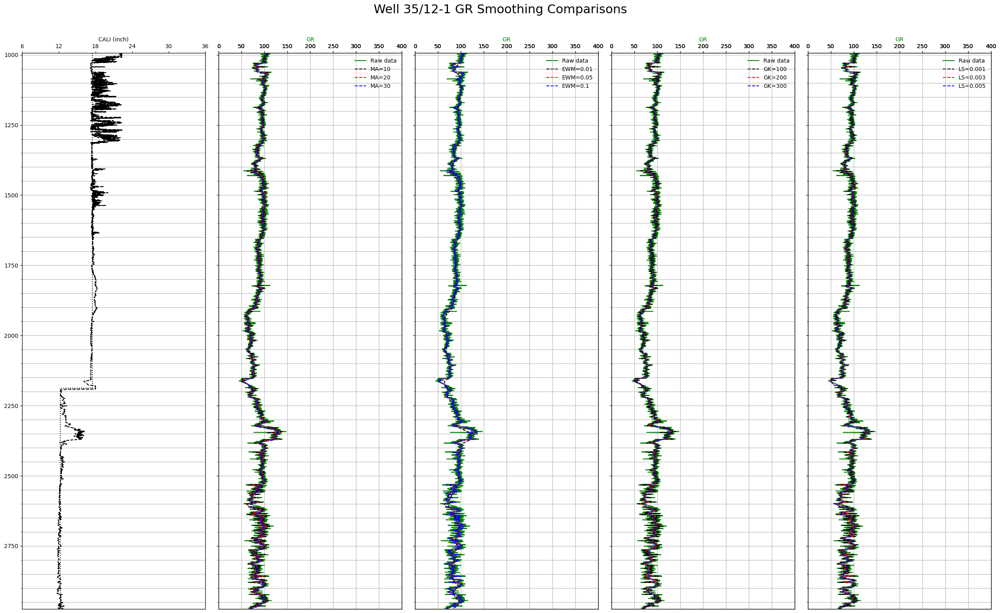

In [220]:
#Display logs for the whole well

well_plotsmooth(well_name,well_test.DEPTH.min(),well_test.DEPTH.max())
#well_plotsmooth('15/9-15',2400,3000)

### Well plot zoom

#### Simple moving average

In [221]:
def well_MA(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well_test[well_test['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.4) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
        
    #Set plot axes
    fig, ax = plt.subplots(1,2, figsize=(10,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " GR Simple Moving Average Smoothing", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logscopy, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
    

    ## Track 1
    #Gamma Ray -- Simple moving average
    ax11 = ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR", position='top',color='black')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("black")
    ax11.tick_params(axis='x', colors="black")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()

    ax12 = ax[1].twiny()
    ax12.plot("GR_MA10","DEPTH",'--', data=logs, color="black", label='MA=10')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()

    ax13 = ax[1].twiny()
    ax13.plot("GR_MA20","DEPTH",'--', data=logs, color="red", label='MA=20')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()

    ax14 = ax[1].twiny()
    ax14.plot("GR_MA30","DEPTH",'--', data=logs, color="blue", label='MA=30')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()
    
    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)

    fig.tight_layout()

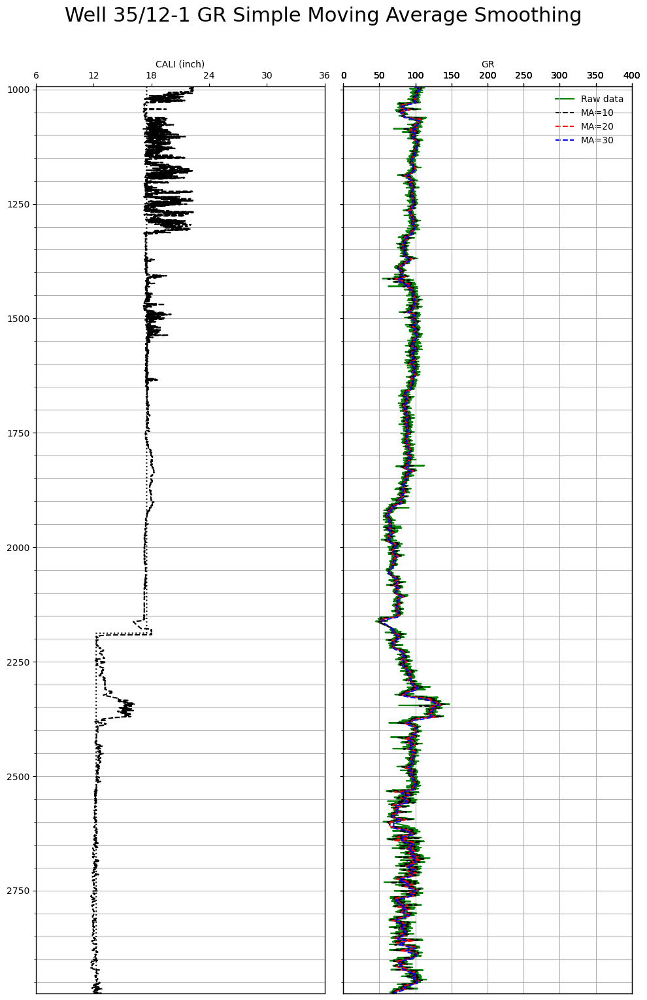

In [222]:
#Display logs for the whole well

#well_plotzoom('15/9-15',well_test[well_test['WELL'] == '15/9-15'].DEPTH.min(),well_test[well_test['WELL'] == '15/9-15'].DEPTH.max())

well_MA(well_name,well_test.DEPTH.min(),well_test.DEPTH.max())
#well_MA(well_name,2000,3000)

#### Exponential weighted moving average

In [223]:
def well_EWM(well_name, top_depth, bottom_depth):
    
    #Set well data
    well_data = well_test[well_test['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.4) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
        
    #Set plot axes
    fig, ax = plt.subplots(1,2, figsize=(10,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " GR Exponential Weighted Moving Average Smoothing", 
                 fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logscopy, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
    

    ## Track 1
    #Gamma Ray -- Exponential weighted moving average

    ax11=ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR (b/e)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()
    #ax11.set_xticks([140, 120, 100, 80, 60, 40])
    
    ax12 = ax[1].twiny()
    ax12.plot("GR_EWM10","DEPTH",'--', data=logs, color="black", label='EWM=0.01')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()
    
    ax13 = ax[1].twiny()
    ax13.plot("GR_EWM20","DEPTH",'--', data=logs, color="red", label='EWM=0.05')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()

    ax14 = ax[1].twiny()
    ax14.plot("GR_EWM30","DEPTH",'--', data=logs, color="blue", label='EWM=0.1')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()

    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)


    fig.tight_layout()

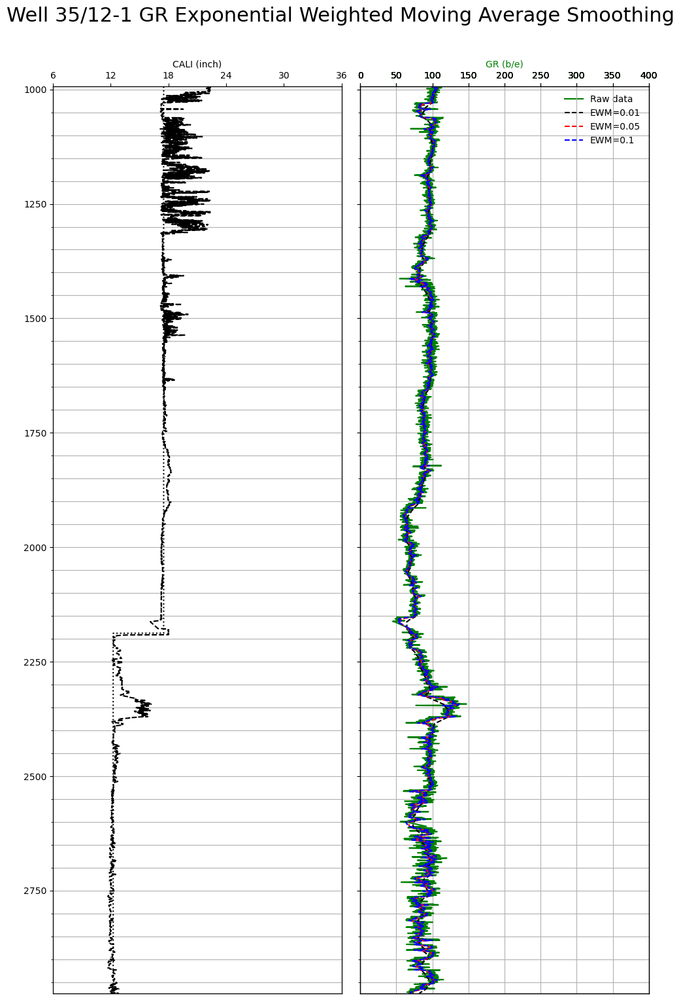

In [224]:
#Display logs for the whole well

#well_plotzoom('15/9-15',well_test[well_test['WELL'] == '15/9-15'].DEPTH.min(),well_test[well_test['WELL'] == '15/9-15'].DEPTH.max())

well_EWM(well_name,well_test.DEPTH.min(),well_test.DEPTH.max())
#well_EWM(well_name,1500,3000)
#well_EWM(well_name,2000,3000)

#### Gaussian

In [225]:
def well_GK(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well_test[well_test['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.4) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
        
    #Set plot axes
    fig, ax = plt.subplots(1,2, figsize=(10,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " GR Gaussian Smoothing", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logscopy, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
    

    ## Track 1
    #Gamma Ray -- Gaussian Smoothing

    ax11=ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR (b/e)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()
    #ax11.set_xticks([140, 120, 100, 80, 60, 40])
    
    ax12 = ax[1].twiny()
    ax12.plot("GR_GK10","DEPTH",'--', data=logs, color="black", label='GK=10')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()
    
    ax13 = ax[1].twiny()
    ax13.plot("GR_GK20","DEPTH",'--', data=logs, color="red", label='GK=50')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()

    ax14 = ax[1].twiny()
    ax14.plot("GR_GK30","DEPTH",'--', data=logs, color="blue", label='GK=100')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()

    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)

    fig.tight_layout()

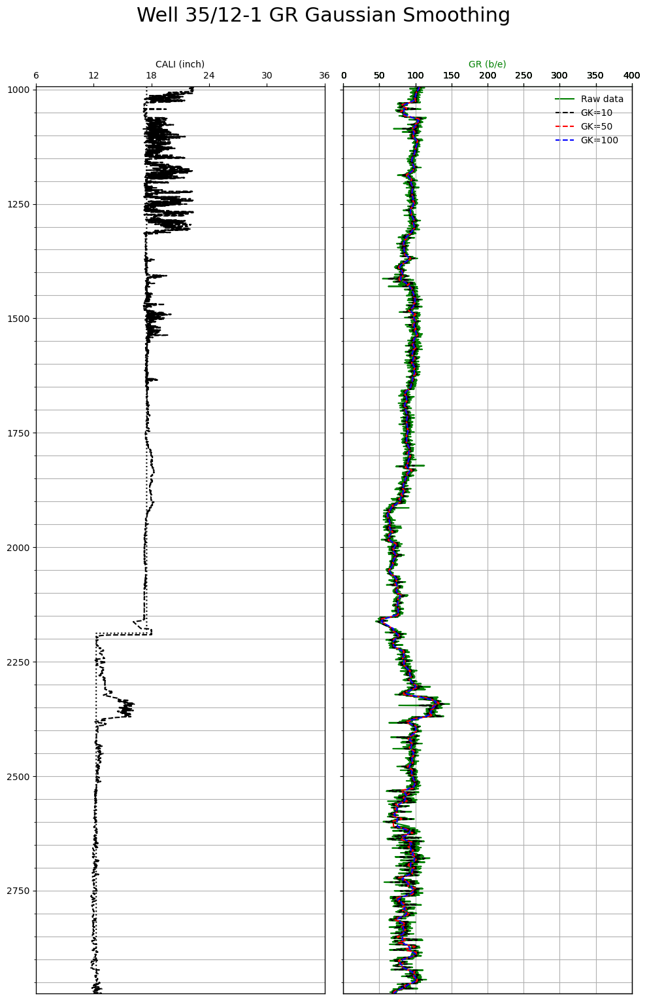

In [226]:
#Display logs for the whole well

#well_plotzoom('15/9-15',well_test[well_test['WELL'] == '15/9-15'].DEPTH.min(),well_test[well_test['WELL'] == '15/9-15'].DEPTH.max())

well_GK(well_name,well_test.DEPTH.min(),well_test.DEPTH.max())
#well_GK(well_name,2000,3000)

#### LOWESS

In [227]:
def well_LOWESS(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well_test[well_test['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
    well_data.loc[:,'BH_SIZE'] = well_data.loc[:,'CALI'] - well_data.loc[:,'BS']
    logscopy=logs.copy()
    logs[(logs.BH_SIZE <= -1.4) & (logs.BH_SIZE >= logs.BH_SIZE.min())] = np.nan
        
    #Set plot axes
    fig, ax = plt.subplots(1,2, figsize=(10,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " GR LOWESS Smoothing", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logscopy, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
    
    ## Track 1
    #Gamma Ray -- LOWESS
    
    ax11=ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR (b/e)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()
    #ax11.set_xticks([140, 120, 100, 80, 60, 40])
    
    ax12 = ax[1].twiny()
    ax12.plot("GR_LS10","DEPTH",'--', data=logs, color="black", label='LS=0.001')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()
    
    ax13 = ax[1].twiny()
    ax13.plot("GR_LS20","DEPTH",'--', data=logs, color="red", label='LS=0.003')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()

    ax14 = ax[1].twiny()
    ax14.plot("GR_LS30","DEPTH",'--', data=logs, color="blue", label='LS=0.005')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()

    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)

    fig.tight_layout()

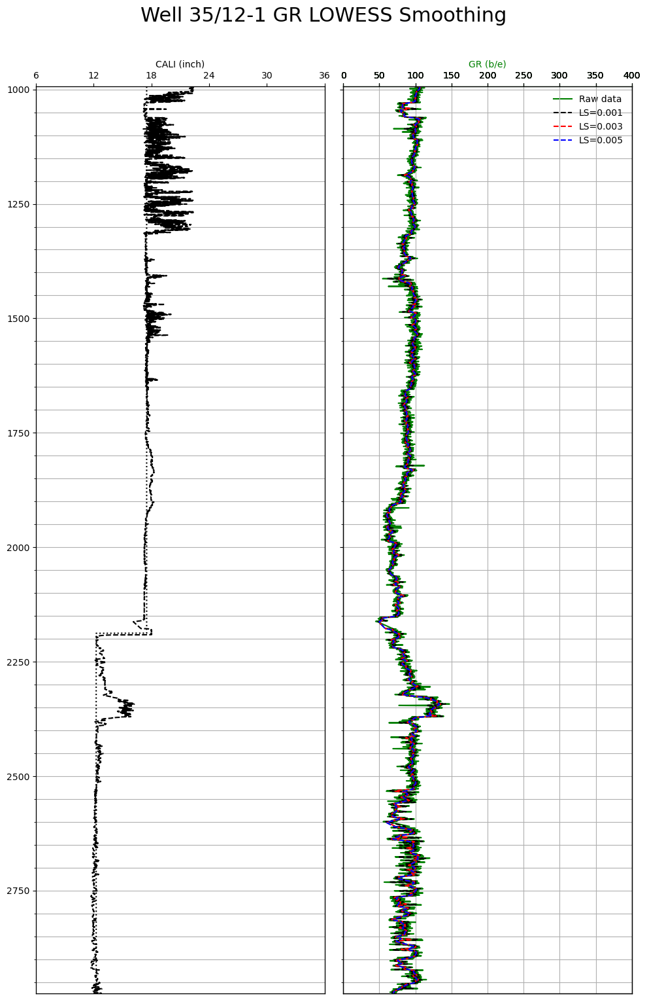

In [228]:
#Display logs for the whole well

#well_plotzoom('15/9-15',well_test[well_test['WELL'] == '15/9-15'].DEPTH.min(),well_test[well_test['WELL'] == '15/9-15'].DEPTH.max())

well_LOWESS(well_name,well_test.DEPTH.min(),well_test.DEPTH.max())
#well_LOWESS(well_name,2000,3000)

## Normalize data

In [229]:
#well_testnorm1 = well_test.copy()
#well_testnorm1
#well_testnorm2 = well_test.copy()
#well_testnorm2
#well_testnorm3 = well_test.copy()
#well_testnorm3
#well_testnorm4 = well_test.copy()
#well_testnorm4
#well_testnorm5 = well_test.copy()
#well_testnorm5
#well_testnorm6 = well_test.copy()
#well_testnorm6
#well_testnorm7 = well_test.copy()
#well_testnorm7
#well_testnorm8 = well_test.copy()
#well_testnorm8


,DEPTH,WELL,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,...,GR_MA30,GR_EWM10,GR_EWM20,GR_EWM30,GR_GK10,GR_GK20,GR_GK30,GR_LS10,GR_LS20,GR_LS30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13120,2973.820801,35/12-1,12.777927,1.525746,2.589892,3.793091,1.860739,70.936188,0.112276,NaN,...,70.736467,82.141556,70.767362,69.475354,69.940589,69.784843,70.616496,70.226921,70.148245,69.407008
13121,2973.972656,35/12-1,12.770145,1.588097,3.013698,4.125785,1.572933,72.828247,0.122513,NaN,...,70.568302,82.048423,70.870406,69.810643,70.000839,69.717096,70.484889,70.602961,70.214692,69.374945
13122,2974.124756,35/12-1,12.768833,2.341989,3.333388,4.669190,1.570367,72.859802,0.125884,NaN,...,70.433114,81.956537,70.969876,70.115559,70.169671,69.687984,70.353869,71.013039,70.284119,69.344303
13123,2974.276611,35/12-1,12.773399,3.759902,3.378008,5.408747,2.964980,71.516373,0.140381,NaN,...,70.328291,81.852135,70.997201,70.255641,70.495916,69.704058,70.239259,71.433918,70.356256,69.315176


In [230]:
well_testnorm = pd.concat([well_testnorm1,well_testnorm2,well_testnorm3,well_testnorm4,well_testnorm5,
                           well_testnorm6,well_testnorm7,well_testnorm8],axis=0)

In [231]:
well_testnorm

,DEPTH,WELL,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,...,GR_MA30,GR_EWM10,GR_EWM20,GR_EWM30,GR_GK10,GR_GK20,GR_GK30,GR_LS10,GR_LS20,GR_LS30
0,460.255005,15/9-15,NaN,1.567587,1.567587,1.735962,NaN,78.275825,NaN,NaN,...,78.275825,78.275825,78.275825,78.275825,79.806681,76.924433,75.299997,80.207775,78.963177,77.542563
1,460.406982,15/9-15,NaN,1.570050,1.570050,1.744778,NaN,79.214615,NaN,NaN,...,78.745220,78.747579,78.757256,78.769925,79.760548,76.898703,75.289089,79.909752,78.799958,77.452687
2,460.558990,15/9-15,NaN,1.553659,1.553659,1.752990,NaN,79.724106,NaN,NaN,...,79.071515,79.076365,79.096204,79.122021,79.606560,76.924417,75.315879,79.598355,78.637660,77.363811
3,460.710999,15/9-15,NaN,1.541216,1.541216,1.760675,NaN,81.042778,NaN,NaN,...,79.564331,79.575404,79.620905,79.680543,79.237213,76.978118,75.325491,79.279749,78.476342,77.275984
4,460.863007,15/9-15,NaN,1.540456,1.540456,1.767360,NaN,80.785133,NaN,NaN,...,79.808492,79.822237,79.878228,79.950278,78.971223,76.939547,75.297547,78.960941,78.315991,77.189234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13120,2973.820801,35/12-1,12.777927,1.525746,2.589892,3.793091,1.860739,70.936188,0.112276,NaN,...,70.736467,82.141556,70.767362,69.475354,69.940589,69.784843,70.616496,70.226921,70.148245,69.407008
13121,2973.972656,35/12-1,12.770145,1.588097,3.013698,4.125785,1.572933,72.828247,0.122513,NaN,...,70.568302,82.048423,70.870406,69.810643,70.000839,69.717096,70.484889,70.602961,70.214692,69.374945
13122,2974.124756,35/12-1,12.768833,2.341989,3.333388,4.669190,1.570367,72.859802,0.125884,NaN,...,70.433114,81.956537,70.969876,70.115559,70.169671,69.687984,70.353869,71.013039,70.284119,69.344303
13123,2974.276611,35/12-1,12.773399,3.759902,3.378008,5.408747,2.964980,71.516373,0.140381,NaN,...,70.328291,81.852135,70.997201,70.255641,70.495916,69.704058,70.239259,71.433918,70.356256,69.315176


In [232]:
def normalize_minmax(df):
    # df on input should contain only one column with the price data (plus dataframe index)
    min = df.min()
    max = df.max()
    x = df 
    
    # time series normalization part
    # y will be a column in a dataframe
    y = (x - min) / (max - min)
    
    return y

In [919]:
well_norm = well_testnorm.copy()
well_norm['GR_MINMAXNORM'] = normalize_minmax(well_norm['GR_MA10'])
well_norm['GR_MINMAXNORMORI'] = normalize_minmax(well_norm['GR'])

In [920]:
well_norm['GR_MINMAXNORM'].describe()

count    138983.000000
mean          0.097868
std           0.058774
min           0.000000
25%           0.057958
50%           0.093962
75%           0.124835
max           1.000000
Name: GR_MINMAXNORM, dtype: float64

In [921]:
well_norm['GR'].describe()

count    138587.000000
mean         74.108889
std          40.830875
min           6.093219
25%          46.659451
50%          71.235023
75%          92.741035
max         843.902954
Name: GR, dtype: float64

In [922]:
well_ref1 = well[well['WELL'] == '33/9-17']
ref1_min = well_ref1['GR'].min()
ref1_max = well_ref1['GR'].max()

well_norm['GR_REFNORM1'] = ref1_min + ((ref1_max - ref1_min) * well_norm['GR_MINMAXNORM'])

well_ref2 = well[well['WELL'] == '35/11-11']
ref2_min = well_ref2['GR'].min()
ref2_max = well_ref2['GR'].max()

well_norm['GR_REFNORM2'] = ref2_min + ((ref2_max - ref2_min) * well_norm['GR_MINMAXNORM'])

well_ref3 = well[well['WELL'] == '33/9-17']
ref3_min = well_ref3['GR'].min()
ref3_max = well_ref3['GR'].max()

well_norm['GR_REFNORM3'] = ref3_min + ((ref3_max - ref3_min) * well_norm['GR_MINMAXNORMORI'])

In [923]:
well_norm['GR_REFNORM1'].describe()

count    138983.000000
mean         63.161754
std          30.540825
min          12.306733
25%          42.423582
50%          61.132099
75%          77.174836
max         531.937866
Name: GR_REFNORM1, dtype: float64

### Well Plot

In [895]:
def well_NORM(well_name, top_depth, bottom_depth):
    #Set well data
    well_data = well_norm[well_norm['WELL'] == well_name]
    logs=well_data[(well_data.DEPTH >= top_depth) & (well_data.DEPTH <= bottom_depth)]
        
    #Set plot axes
    fig, ax = plt.subplots(1,2, figsize=(10,15), sharey=True)
    fig.suptitle("Well " + str(well_name) + " Normalized (GR_EWM0.1)", fontsize=22, va='baseline', y=1)
    fig.subplots_adjust(wspace=0.1)

    #General setting
    for axes in ax:
        axes.set_ylim(top_depth, bottom_depth)
        axes.invert_yaxis()
        axes.yaxis.grid(True, which='both')
        axes.get_yaxis().set_minor_locator(matplotlib.ticker.AutoMinorLocator(5))
        axes.get_xaxis().set_visible(False)
        axes.get_yaxis().set_visible(True)

    #Track 0
    #Caliper
    ax01 = ax[0].twiny()
    ax01.plot("CALI","DEPTH",'--', data=logs, color="black")
    ax01.set_xlim(6, 36)
    ax01.set_xlabel("CALI (inch)", position='top',color='black')
    ax01.spines["top"].set_position(("outward", 0))
    ax01.spines["top"].set_edgecolor("black")
    ax01.tick_params(axis='x', colors="black")
    ax01.set_xticks([6, 12, 18, 24, 30, 36])

    #Bit size
    ax02 = ax[0].twiny()
    ax02.plot("BS","DEPTH",':', data=logs, color="black")
    ax02.set_xlim(6, 36)
    ax02.tick_params(axis='x', colors="black", top=False, bottom=False, labeltop=False, labelbottom=False)
        
    ## Track 1
    #Gamma Ray -- Simple moving average

    ax11 = ax[1].twiny()
    ax11.plot("GR","DEPTH", data=logs, color="green", label='Raw data')
    ax11.set_xlim(0, 400)
    ax11.set_xlabel("GR (API)", position='top',color='green')
    ax11.spines["top"].set_position(("outward", 0))
    ax11.spines["top"].set_edgecolor("green")
    ax11.tick_params(axis='x', colors="green")
    ax11.grid(True)
    lh11, l11 = ax11.get_legend_handles_labels()

    ax12 = ax[1].twiny()
    ax12.plot("GR_REFNORM3","DEPTH",'--', data=logs, color="black", label='REFNORM ORI')
    ax12.set_xlim(0, 400)
    lh12, l12 = ax12.get_legend_handles_labels()

    ax13 = ax[1].twiny()
    ax13.plot("GR_REFNORM1","DEPTH",'--', data=logs, color="blue", label='REFNORM EWM=0.1 (33/9-17)')
    ax13.set_xlim(0, 400)
    lh13, l13 = ax13.get_legend_handles_labels()
    
    ax14 = ax[1].twiny()
    ax14.plot("GR_REFNORM2","DEPTH",'--', data=logs, color="red", label='REFNORM EWM=0.1 (35/11-11)')
    ax14.set_xlim(0, 400)
    lh14, l14 = ax14.get_legend_handles_labels()


    ax[1].legend(lh11+lh12+lh13+lh14, l11+l12+l13+l14, loc='upper right', ncol=1, frameon=False)

    fig.tight_layout()

## Select well data used

There are 8 wells that will be analyzed.
1. **15/9-15** 
2. **16/4-1** 
3. **25/2-7**
4. **25/4-5** 
5. **31/2-19 S** 
6. **33/9-17**       
7. **35/11-11** 
8. **35/12-1**


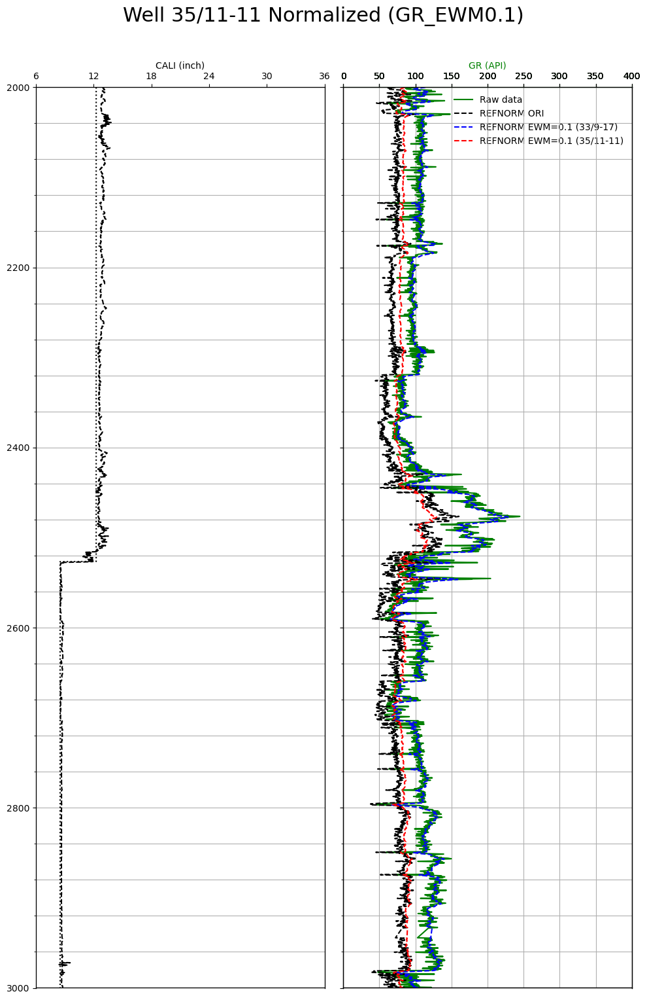

In [897]:
#Display logs for the whole well

#well_plotzoom('15/9-15',well_test[well_test['WELL'] == '15/9-15'].DEPTH.min(),well_test[well_test['WELL'] == '15/9-15'].DEPTH.max())
well_namenorm='35/11-11'
#well_NORM(well_namenorm,well_norm[well_norm['WELL'] == well_namenorm].DEPTH.min(),well_norm[well_norm['WELL'] == well_namenorm].DEPTH.max())
#well_plotzoom('15/9-15',2400,3000)
well_NORM(well_namenorm,2000,3000)


### Histogram

In [910]:
#Histogram on each specific column for more detail
well_curves = list(well_norm) #Create a list of curve names
well_curves.remove("WELL") #Remove the curve to focus only on curves
well_curves.remove("DEPTH") #Remove the curve to focus only on curves
well_curves.remove("CALI") #Remove the curve to focus only on curves
well_curves.remove("BS") #Remove the curve to focus only on curves
well_curves.remove("RSHA") #Remove the curve to focus only on curves
well_curves.remove("RMED") #Remove the curve to focus only on curves
well_curves.remove("RDEP") #Remove the curve to focus only on curves
well_curves.remove("RXO") #Remove the curve to focus only on curves
well_curves.remove("NPHI") #Remove the curve to focus only on curves
well_curves.remove("PEF") #Remove the curve to focus only on curves
well_curves.remove("RHOB") #Remove the curve to focus only on curves
well_curves.remove("SP") #Remove the curve to focus only on curves
well_curves.remove("DRHO") #Remove the curve to focus only on curves
well_curves.remove("DTC") #Remove the curve to focus only on curves
well_curves.remove("DTS") #Remove the curve to focus only on curves
well_curves.remove("BH_SIZE") #Remove the curve to focus only on curves
well_curves.remove("LITHOLOGY") #Remove the curve to focus only on curves
well_curves.remove("GR_MA10") #Remove the curve to focus only on curves 
well_curves.remove("GR_MA20") #Remove the curve to focus only on curves 
well_curves.remove("GR_MA30") #Remove the curve to focus only on curves 
well_curves.remove("GR_EWM10") #Remove the curve to focus only on curves 
well_curves.remove("GR_EWM20") #Remove the curve to focus only on curves 
well_curves.remove("GR_EWM30") #Remove the curve to focus only on curves 
well_curves.remove("GR_GK10") #Remove the curve to focus only on curves 
well_curves.remove("GR_GK20") #Remove the curve to focus only on curves 
well_curves.remove("GR_GK30") #Remove the curve to focus only on curves 
well_curves.remove("GR_LS10") #Remove the curve to focus only on curves 
well_curves.remove("GR_LS20") #Remove the curve to focus only on curves 
well_curves.remove("GR_LS30") #Remove the curve to focus only on curves 
well_curves.remove("GR_MINMAXNORM") #Remove the curve to focus only on curves
well_curves.remove("GR_MINMAXNORMORI") #Remove the curve to focus only on curves 
well_curves.remove("GR_REFNORM2") #Remove the curve to focus only on curves 


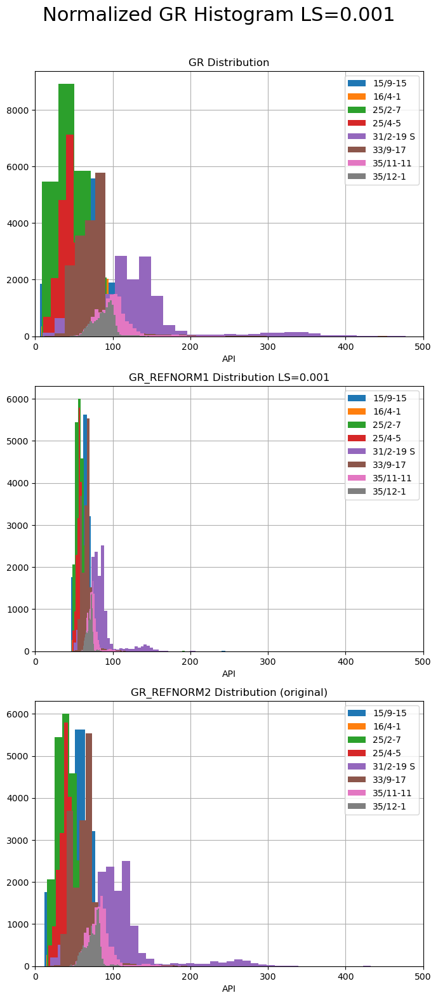

In [804]:
fig = plt.figure(figsize=(7,20))
for i, feature in enumerate(well_curves):
    ax=fig.add_subplot(4,1,i+1)
    well_norm.groupby('WELL')[feature].hist(bins=40, ax=ax, legend=True,grid=True)
    ax.set_xlim([0,500])
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    if i==1:
        ax.set_title(feature+" Distribution LS=0.001")
    if i==2:
        ax.set_title(feature+" Distribution (original)")
    ax.set_axisbelow(True)
    ax.set_xlabel('API')
    fig.suptitle("Normalized GR Histogram LS=0.001", fontsize=22, va='baseline', y=1)
    

plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

### KDE

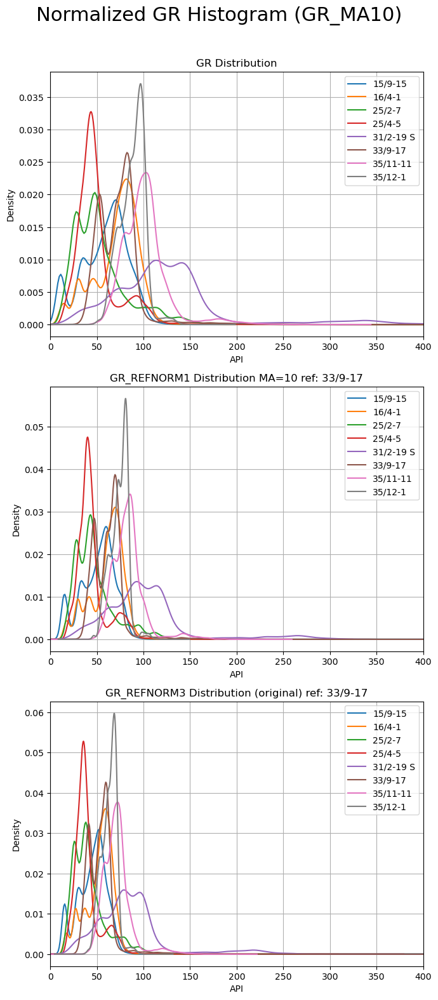

In [924]:
fig = plt.figure(figsize=(7,20))
for i, feature in enumerate(well_curves):
    ax=fig.add_subplot(4,1,i+1)
    well_norm.groupby('WELL')[feature].plot(kind="kde", grid=True, legend=True, xlim=[0,400])
    ax.set_title(feature+" Distribution")
    ax.set_axisbelow(True)
    if i==1:
        ax.set_title(feature+" Distribution MA=10 ref: 33/9-17")
    if i==2:
        ax.set_title(feature+" Distribution (original) ref: 33/9-17")
    ax.set_axisbelow(True)
    ax.set_xlabel('API')
    fig.suptitle("Normalized GR Histogram (GR_MA10)", fontsize=22, va='baseline', y=1)
    

plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

### Boxplot

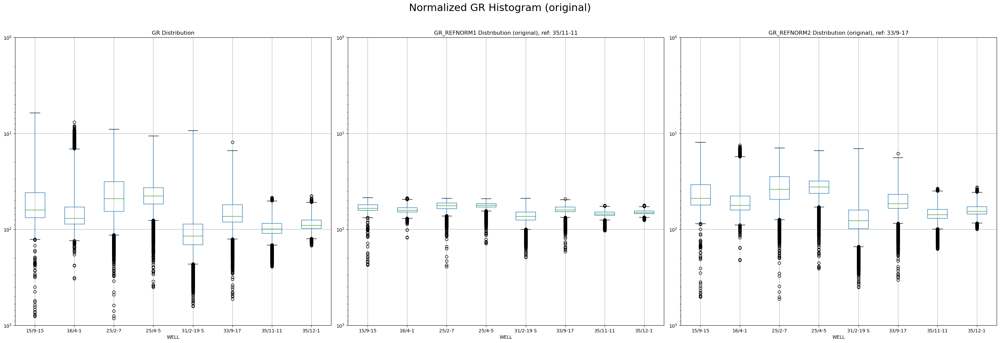

In [700]:
well_box = list(well_norm) #Create a list of curve names
well_box.remove("WELL") #Remove the curve to focus only on curves
well_box.remove("DEPTH") #Remove the curve to focus only on curves
well_box.remove("CALI") #Remove the curve to focus only on curves
well_box.remove("BS") #Remove the curve to focus only on curves
well_box.remove("RSHA") #Remove the curve to focus only on curves
well_box.remove("RMED") #Remove the curve to focus only on curves
well_box.remove("RDEP") #Remove the curve to focus only on curves
well_box.remove("RXO") #Remove the curve to focus only on curves
well_box.remove("NPHI") #Remove the curve to focus only on curves
well_box.remove("PEF") #Remove the curve to focus only on curves
well_box.remove("RHOB") #Remove the curve to focus only on curves
well_box.remove("SP") #Remove the curve to focus only on curves
well_box.remove("DRHO") #Remove the curve to focus only on curves
well_box.remove("DTC") #Remove the curve to focus only on curves
well_box.remove("DTS") #Remove the curve to focus only on curves
well_box.remove("BH_SIZE") #Remove the curve to focus only on curves
well_box.remove("LITHOLOGY") #Remove the curve to focus only on curves
well_box.remove("GR_MA10") #Remove the curve to focus only on curves 
well_box.remove("GR_MA20") #Remove the curve to focus only on curves 
well_box.remove("GR_MA30") #Remove the curve to focus only on curves 
well_box.remove("GR_EWM10") #Remove the curve to focus only on curves 
well_box.remove("GR_EWM20") #Remove the curve to focus only on curves 
well_box.remove("GR_EWM30") #Remove the curve to focus only on curves 
well_box.remove("GR_GK10") #Remove the curve to focus only on curves 
well_box.remove("GR_GK20") #Remove the curve to focus only on curves 
well_box.remove("GR_GK30") #Remove the curve to focus only on curves 
well_box.remove("GR_LS10") #Remove the curve to focus only on curves 
well_box.remove("GR_LS20") #Remove the curve to focus only on curves 
well_box.remove("GR_LS30") #Remove the curve to focus only on curves 
well_box.remove("GR_MINMAXNORM") #Remove the curve to focus only on curves
well_box.remove("GR_MINMAXNORMORI") #Remove the curve to focus only on curves 

fig = plt.figure(figsize=(30,10))

for i, feature in enumerate(well_box):
    ax=fig.add_subplot(1,3,i+1)
    well_norm.boxplot(by ='WELL', column=feature, ax=ax, sharex=False, vert=True, grid=True)
    ax.set_title(feature+" Distribution")
    ax.set_yscale('log')
    ax.set_ylim([1,1000])
    if i==1:
        ax.set_title(feature+" Distribution (original), ref: 35/11-11")
    if i==2:
        ax.set_title(feature+" Distribution (original), ref: 33/9-17")
    ax.invert_yaxis()
    ax.set_axisbelow(True)
    fig.suptitle("Normalized GR Histogram (original)", fontsize=22, va='baseline', y=1)    

#plt.savefig('boxplotcoverage.png')
plt.subplots_adjust(hspace=0.15, wspace=0.5)
plt.tight_layout()
plt.show()

In [761]:
well_density

[('15/9-15',
               DEPTH     WELL      CALI      RSHA      RMED      RDEP  RXO   
  0       460.255005  15/9-15       NaN  1.567587  1.567587  1.735962  NaN  \
  1       460.406982  15/9-15       NaN  1.570050  1.570050  1.744778  NaN   
  2       460.558990  15/9-15       NaN  1.553659  1.553659  1.752990  NaN   
  3       460.710999  15/9-15       NaN  1.541216  1.541216  1.760675  NaN   
  4       460.863007  15/9-15       NaN  1.540456  1.540456  1.767360  NaN   
  ...            ...      ...       ...       ...       ...       ...  ...   
  17712  3173.941162  15/9-15  7.776711  0.987094  0.987094  0.862399  NaN   
  17713  3174.093262  15/9-15  7.779644  0.969350  0.969350  0.847839  NaN   
  17714  3174.245117  15/9-15  7.792982  0.962780  0.962780  0.844712  NaN   
  17715  3174.397217  15/9-15       NaN  0.973905  0.973905  0.839559  NaN   
  17716  3174.548828  15/9-15       NaN  1.005314  1.005314  0.828312  NaN   
  
                GR      NPHI        PEF  ...    

In [702]:
well_norm.describe()

,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,...,GR_EWM30,GR_GK10,GR_GK20,GR_GK30,GR_LS10,GR_LS20,GR_LS30,GR_MINMAXNORM,GR_REFNORM1,GR_REFNORM2
count,138587.000000,138087.000000,107612.000000,137467.000000,138546.000000,57985.000000,138587.000000,115406.000000,107964.000000,138062.000000,...,139918.000000,138991.000000,139487.000000,139706.000000,139028.000000,139028.000000,139028.000000,138587.000000,138587.000000,138587.000000
mean,2130.278624,13.897326,15.693641,4.461516,4.829588,8.345017,74.108889,0.339282,4.918612,2.269921,...,73.878673,74.030649,73.953283,73.928769,73.995303,73.915343,73.875563,0.081183,62.832342,54.491800
std,877.728276,3.848432,134.235684,32.351913,34.266784,49.808269,40.830875,0.126395,5.403047,0.256775,...,39.330658,40.129801,38.738795,38.046224,40.104258,38.958605,38.572953,0.048735,9.652037,25.324358
min,175.335449,7.100316,0.005141,0.127000,0.264479,0.059247,6.093219,-0.031457,0.709315,1.309546,...,7.331444,7.206841,7.816218,8.386799,7.426107,7.808289,8.127046,0.000000,46.754074,12.306733
25%,1462.269592,11.958519,0.834460,0.894383,0.992030,0.742544,46.659451,0.257071,3.142162,2.055911,...,46.874623,46.781003,46.932610,46.967947,46.774143,46.620564,46.476113,0.048419,56.343552,37.466953
50%,2118.861328,12.993491,1.382149,1.417605,1.556555,1.826320,71.235023,0.342522,3.837326,2.282607,...,71.343922,71.358863,71.763718,71.884975,71.404841,71.480403,71.729821,0.077753,62.152987,52.709355
75%,2770.778076,17.509286,3.184551,3.020829,3.077520,4.917125,92.741035,0.439157,4.935758,2.490284,...,92.215789,92.442890,92.233483,91.992779,92.460932,92.513003,92.371469,0.103422,67.236807,66.047936
max,4324.610840,25.717396,1999.800049,1950.000000,1894.385132,1989.840698,843.902954,0.812641,365.575592,3.163656,...,541.711465,690.116136,425.813155,369.604770,843.902954,412.008039,370.907380,1.000000,244.804459,531.937866


In [815]:
well_norm[well_norm['WELL'] == '33/9-17'].describe()

,DEPTH,CALI,RSHA,RMED,RDEP,RXO,GR,NPHI,PEF,RHOB,...,GR_GK10,GR_GK20,GR_GK30,GR_LS10,GR_LS20,GR_LS30,GR_MINMAXNORM,GR_MINMAXNORMORI,GR_REFNORM1,GR_REFNORM2
count,17702.000000,17325.000000,17702.000000,17323.000000,17702.000000,9366.000000,17702.000000,17325.000000,17323.000000,17325.000000,...,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000,17702.000000
mean,1835.382651,10.536173,1.605396,2.017689,1.535577,2.132847,72.965034,0.389716,9.194627,2.234024,...,72.964766,72.969369,72.969983,72.925667,72.872565,72.772654,0.122801,0.079817,71.074857,76.117951
std,777.106378,1.851073,0.929819,32.676675,0.796676,5.626812,24.738253,0.076081,8.827044,0.219999,...,23.791341,21.586914,20.703053,23.598768,21.409698,20.767841,0.042393,0.029527,8.395909,22.028615
min,489.515839,7.619217,0.466225,0.429809,0.431000,0.147903,12.306733,0.040000,2.756364,1.566400,...,18.163899,36.328657,39.471555,13.474823,29.640884,32.860863,0.009310,0.007416,48.598001,17.144704
25%,1162.082062,8.851599,1.017862,0.949100,1.018678,1.262018,55.386258,0.332082,3.872552,2.086869,...,55.221782,55.309658,55.271525,55.203439,55.172430,55.235375,0.089560,0.058836,64.491477,58.844925
50%,1836.812866,9.711088,1.450862,1.365612,1.371369,1.793444,72.942318,0.384541,6.165475,2.264624,...,72.952617,73.076221,72.939580,72.850699,73.025475,73.050169,0.122929,0.079790,71.100191,76.184418
75%,2508.826599,12.358497,1.911266,1.784034,1.811299,2.221886,83.549370,0.450000,12.406597,2.416952,...,83.382727,83.145857,83.115092,83.391881,83.301989,83.208305,0.142058,0.092451,74.888798,86.124708
max,3179.496582,19.164907,18.181602,1950.000000,9.836267,266.032989,531.937866,0.597724,353.283417,3.046810,...,442.607414,242.063944,187.425008,490.011414,202.195885,178.381163,0.654362,0.627642,176.350745,352.333666


In [475]:
well_curves

['GR', 'GR_MINMAXNORM', 'GR_REFNORM', 'GR_REFNORM1', 'GR_REFNORM2']